In [1]:
import torch
from utils import plot_convergence, analyze_experiment_results, get_worst_classes_from_file, analyze_spikes, analyze_membrane, plot_membrane_one_per_class, analyze_spike_counts_from_file, analyze_weights, plot_topk_accuracy_bar
from experiments import run_param_experiment, run_loss_experiment, run_model_experiment, run_confusion_matrix_experiment, final_training_and_validation, run_finetuning, run_alpha_experiment, run_beta_experiment, run_alpha_beta_grid_experiment, run_sparsity_experiment, run_fanin_experiment
# ---- Paths (edit as needed)
MAT_PATH = "smarthand_dataset.mat"
RANK_CSV = "res95_ranked_taxels.csv"   # produced by your PCA+Pearson script
TOPN = 300
# Paths and constants
NUM_FRAMES_PER_SAMPLE = 50  # Chunk size
SAMPLING_FREQUENCY = 100.0  # 100 frames/sec = 100 Hz
FRAME_DURATION_MS = 1000.0 / SAMPLING_FREQUENCY  # 10 ms per frame
NUM_FRAMES = 1200  # number of time frames to encode each sample
THRESHOLD = 0.03  # threshold for delta modulation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


+1/-1 better \
0.3 beta better \
learn beta better \
more layers but smaller better \
add gaussian noise better \
ce loss + 0.1 * mse membrane loss better \

# DOUBLE CHANNEL EXPERIMENTS

## Loss experiment - ce_rate loss vs. ce_rate loss + mse_membrane loss

In [5]:
# Run loss experiment with single layer
results_loss_single = run_loss_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    num_inputs=2*484,
    num_outputs=17,
    input_file="spike_data_topn_None_num_frames_50_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="loss_comparison_channels_2"
)

Loaded data from preprocessed_data\spike_data_topn_None_num_frames_50_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 50, 'threshold': 0.03, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Test class distribution: [9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
Fold 2: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Test class distribution: [9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
Fold 3: CV Train samples = 595, CV Test samples = 153
  - CV Train class distribution: [35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35 35]
  - CV Test class distribution: [9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
Fold 4: CV Train samples = 595, CV Test samples =

Available keys in experiments/loss_comparison_channels_2.npz: ['ce_only', 'combined']


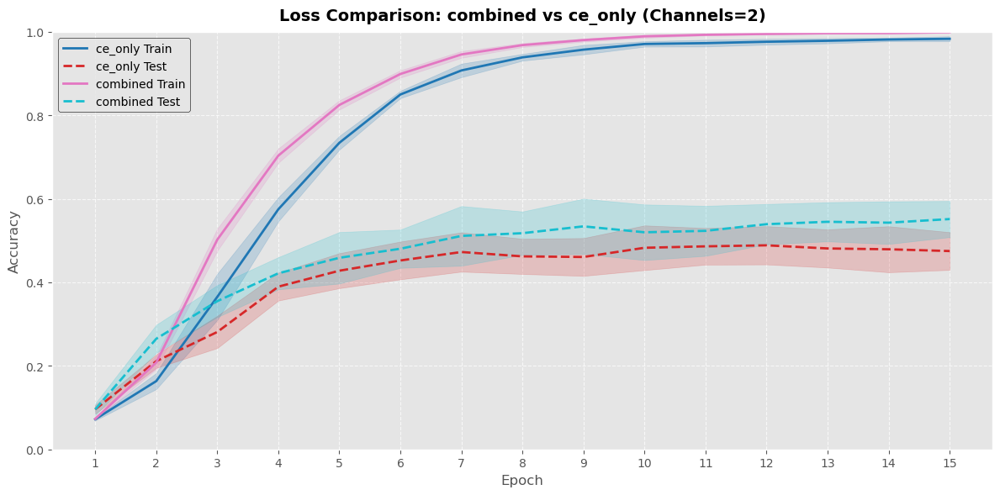

In [6]:
plot_convergence(
    file_path="experiments/loss_comparison_channels_2.npz",
    save_path="figures/plot_loss_comparison_channels_2.png",
    plt_title="Loss Comparison: combined vs ce_only (Channels=2)",
    plot_std=True,
    include_keys=None
)

In [2]:
analyze_experiment_results(
    file_path="experiments/loss_comparison_channels_2.npz",
)  

Available keys in experiments/loss_comparison_channels_2.npz: ['ce_only', 'combined']

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   ce_only             0.993277            0.549020                0.983315               0.475000
  combined             1.000000            0.620915                0.998992               0.551634


## Num frames experiment - threshold 0.03

In [7]:
fixed_params = {"topn": None, "threshold": 0.03, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="num_frames",
    varying_values=[5, 10, 25, 50],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=20,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for num_frames = 5 from preprocessed_data\spike_data_topn_None_num_frames_5_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_None_num_frames_5_threshold_0.03_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 5, 'threshold': 0.03, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352]
  - CV Test class distribution: [88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88]
Fold 2: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 35

Available keys in experiments/param_num_frames_20251212_0953.npz: ['5', '10', '25', '50']


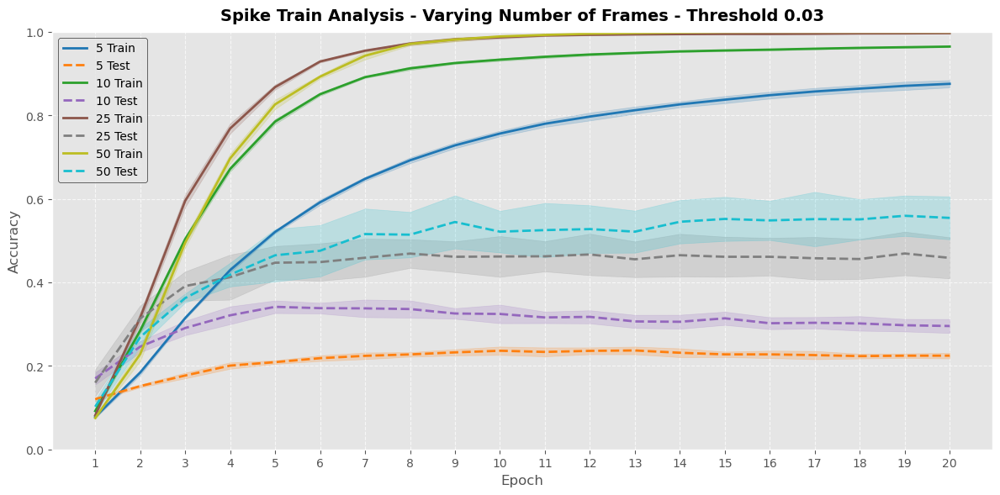

In [8]:
plot_convergence(
    "experiments/param_num_frames_20251212_0953.npz",
    "figures/plot_num_frames.png",
    "Spike Train Analysis - Varying Number of Frames - Threshold 0.03",
    plot_std=True
)

## Threshold experiment - Num frames 25

In [5]:
fixed_params = {"topn": None, "num_frames": 25, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02, 0.03],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70

Available keys in experiments/param_threshold_20251212_1016.npz: ['0.005', '0.01', '0.02', '0.03']


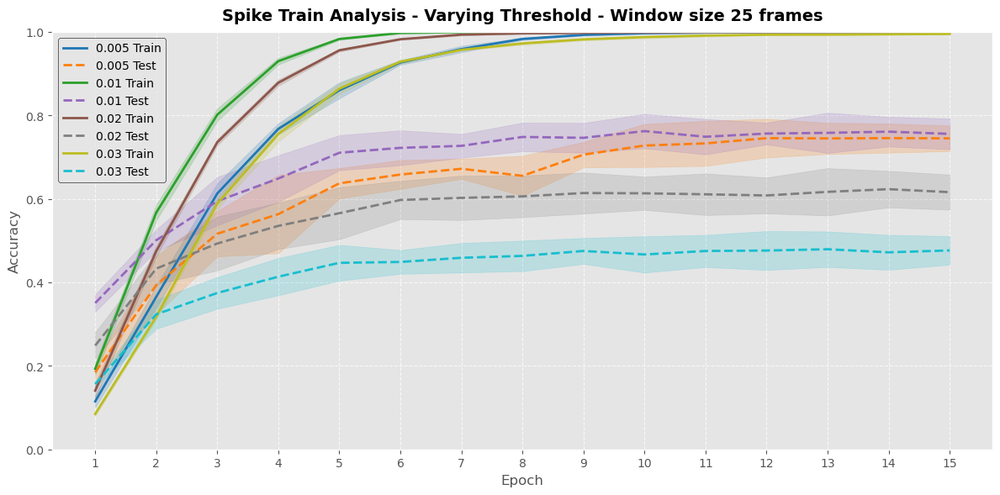

In [7]:
plot_convergence(
    "experiments/param_threshold_20251212_1016.npz",
    "figures/plot_threshold_25_frames.png",
    "Spike Train Analysis - Varying Threshold - Window size 25 frames",
    plot_std=True
)

In [11]:
analyze_experiment_results(
    "experiments/param_threshold_20251212_1016.npz")

Available keys in experiments/param_threshold_20251212_1016.npz: ['0.005', '0.01', '0.02', '0.03']


TypeError: list indices must be integers or slices, not tuple

## Threshold experiment - Num frames 10

In [13]:
fixed_params = {"topn": None, "num_frames": 10, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.003, 0.004, 0.005, 0.01],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for threshold = 0.003 from preprocessed_data\spike_data_topn_None_num_frames_10_threshold_0.003_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_None_num_frames_10_threshold_0.003_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 10, 'threshold': 0.003, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176]
  - CV Test class distribution: [44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44]
Fold 2: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176

Available keys in experiments/param_threshold_20251212_1048.npz: ['0.003', '0.004', '0.005', '0.01']


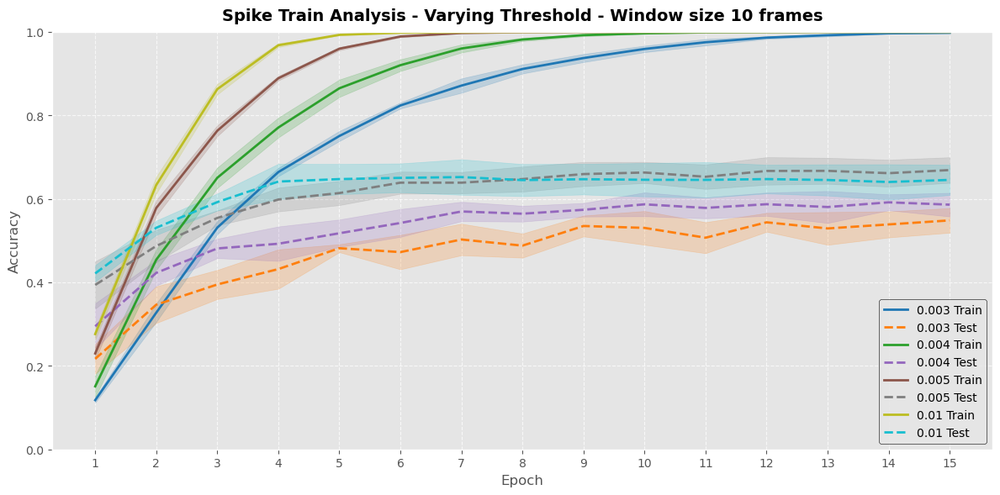

In [14]:
plot_convergence(
    "experiments/param_threshold_20251212_1048.npz",
    "figures/plot_threshold_10_frames.png",
    "Spike Train Analysis - Varying Threshold - Window size 10 frames",
    plot_std=True
)

In [15]:
analyze_experiment_results(
    "experiments/param_threshold_20251212_1048.npz")

Available keys in experiments/param_threshold_20251212_1048.npz: ['0.003', '0.004', '0.005', '0.01']


TypeError: list indices must be integers or slices, not tuple

## Threshold experiment - Num frames 5

In [16]:
fixed_params = {"topn": None, "num_frames": 5, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=20,
    batch_size=32,
    device=device,
    verbose=True
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data\spike_data_topn_None_num_frames_5_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_None_num_frames_5_threshold_0.005_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 5, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352]
  - CV Test class distribution: [88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88]
Fold 2: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 

Available keys in experiments/param_threshold_20251212_1104.npz: ['0.005', '0.01']


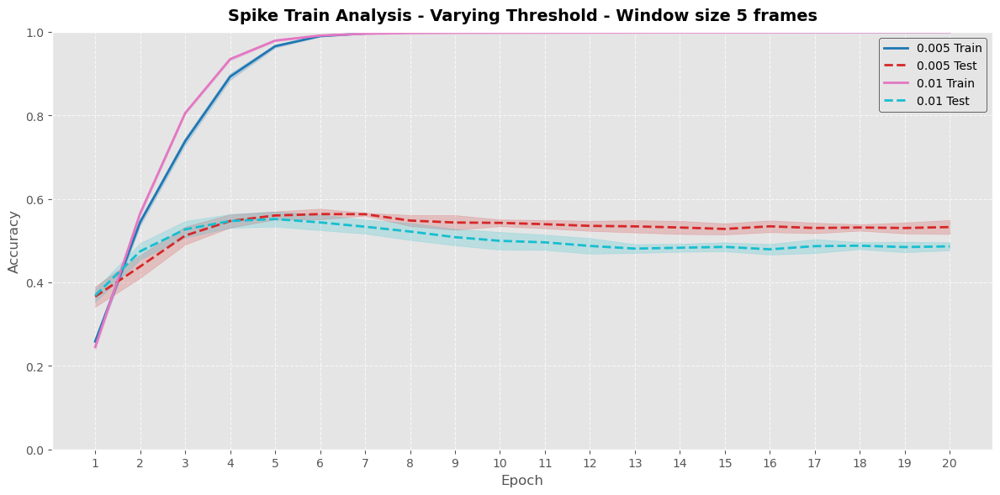

In [17]:
plot_convergence(
    "experiments/param_threshold_20251212_1104.npz",
    "figures/plot_threshold_5_frames.png",
    "Spike Train Analysis - Varying Threshold - Window size 5 frames",
    plot_std=True
)

In [18]:
analyze_experiment_results(
    "experiments/param_threshold_20251212_1104.npz")

Available keys in experiments/param_threshold_20251212_1104.npz: ['0.005', '0.01']


TypeError: list indices must be integers or slices, not tuple

## TOPN experiment - Num frames 25, threshold 0.01

In [20]:
fixed_params = {"num_frames": 25, "threshold": 0.01, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="topn",
    varying_values=[200, 250, 300, 350],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for topn = 200 from preprocessed_data\spike_data_topn_200_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_200_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 

Available keys in experiments/param_topn_20251212_1224.npz: ['200', '250', '300', '350']


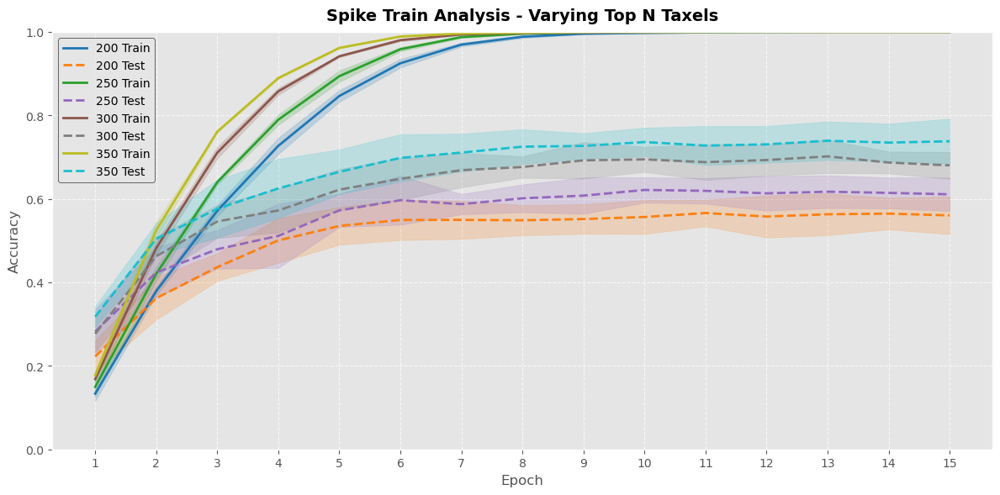

In [22]:
plot_convergence(
    "experiments/param_topn_20251212_1224.npz",
    "figures/plot_topn.png",
    "Spike Train Analysis - Varying Top N Taxels",
    plot_std=True
)

In [23]:
analyze_experiment_results(
    file_path="experiments/param_topn_20251212_1224.npz",
    save_path="experiments/analysis_topn.txt"
)

TypeError: analyze_experiment_results() got an unexpected keyword argument 'save_path'

## Confusion Matrix

In [ ]:
results =run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=10,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.7,
    beta=0.7,
)

Loaded data from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18

## Validation for best hyperparameters

In [31]:
fixed_params = {"topm": None, "num_frames": 25, "threshold": 0.01, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results = final_training_and_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=2,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    alpha=0.7,
    beta=0.7,
    lr=0.001
)


######################################################################
Starting final training from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8131, Avg Train Accuracy: 19.45%
Epoch 1 - Avg Val Loss: 2.7096, Avg Val Accuracy: 36.76%
Epoch 2 - Avg Train Loss: 2.5853, Avg Train Accuracy: 56.68%
Epoch 2 - Avg Val Loss: 2.6640, Avg Val Accuracy: 47.06%
Epoch 3 - Avg Train Loss: 2.4052, Avg Train Accuracy: 82.89%
Epoch 3 - Avg Val Loss: 2.5594, Avg V

## Validation for TOPN = 300

In [32]:
fixed_params = {"topn": 300, "num_frames": 25, "threshold": 0.01, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results = final_training_and_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=2,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001
)


######################################################################
Starting final training from preprocessed_data\spike_data_topn_300_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data\spike_data_topn_300_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8147, Avg Train Accuracy: 18.05%
Epoch 1 - Avg Val Loss: 2.7457, Avg Val Accuracy: 38.24%
Epoch 2 - Avg Train Loss: 2.6236, Avg Train Accuracy: 50.80%
Epoch 2 - Avg Val Loss: 2.6254, Avg Val Accuracy: 50.74%
Epoch 3 - Avg Train Loss: 2.4713, Avg Train Accuracy: 74.80%
Epoch 3 - Avg Val Loss: 2.6270, Avg Val 

## Finetuning

In [2]:
fixed_params = {"topn": 300, "num_frames": 25, "threshold": 0.01, "channels": 2, "down_spike": -1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}

results = run_finetuning(
    fixed_params = fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    fine_tune_epochs=20,
    noise_std=0.01,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running fine-tuning experiment with fixed parameters from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70

UnboundLocalError: local variable 'forward_pass' referenced before assignment

# SINGLE CHANNEL EXPERIMENTS

## PALM PIXELS (484)


### Reduce DOWN spike intensity Experiment

In [3]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="down_spike",
    varying_values=[-0.1, -0.2, -0.5, -1.0],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for down_spike = -0.1 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_-0.1_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_-0.1_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': -0.1, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70

Available keys in experiments/param_down_spike_20251212_1612.npz: ['-0.1', '-0.2', '-0.5', '-1.0']


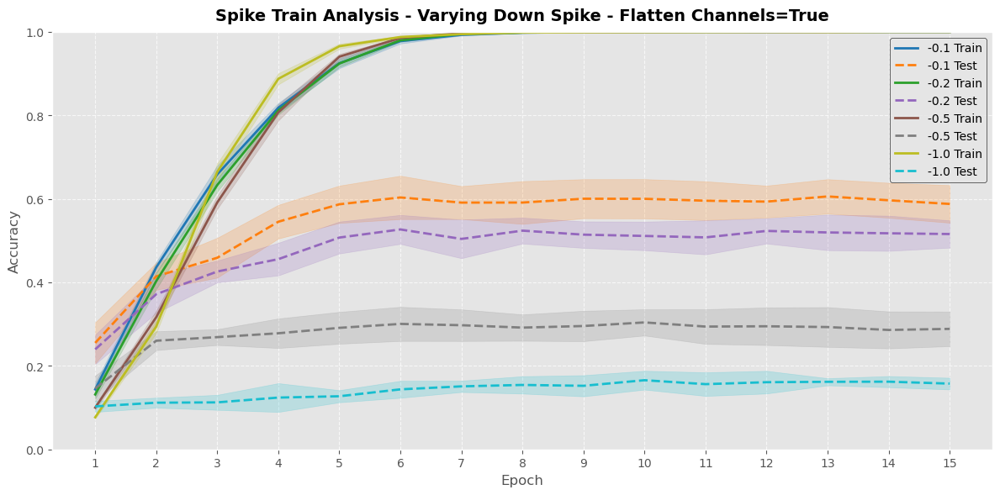

In [11]:
plot_convergence(
    "experiments/param_down_spike_20251212_1612.npz",
    "figures/plot_down_spike_channel_2_test_1.png",
    "Spike Train Analysis - Varying Down Spike - Flatten Channels=True",
    plot_std=True
)

In [11]:
analyze_experiment_results(
    file_path="experiments/param_down_spike_20251212_1612.npz",
    save_path="experiments/analysis_down_spike_test1.txt"    
)

TypeError: analyze_experiment_results() got an unexpected keyword argument 'save_path'

### Positive DOWN spike Experiment

In [ ]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="down_spike",
    varying_values=[1.0, -0.5, 0.5, 1.0],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)

Available keys in experiments/param_down_spike_20251212_1651.npz: ['-1.0', '-0.5', '0.5', '1.0']


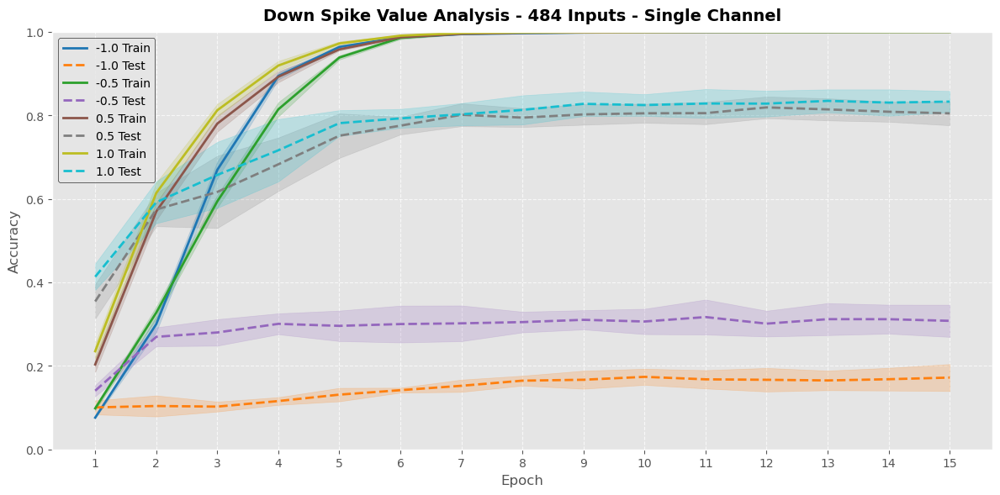

In [10]:
plot_convergence(
    "experiments/param_down_spike_20251212_1651.npz",
    "figures/plot_down_spike_channel_2_test_2.png",
    "Down Spike Value Analysis - 484 Inputs - Single Channel",
    plot_std=True,
)

In [6]:
analyze_experiment_results(
    file_path="experiments/param_down_spike_20251212_1651.npz",
)

Available keys in experiments/param_down_spike_20251212_1651.npz: ['-1.0', '-0.5', '0.5', '1.0']


TypeError: list indices must be integers or slices, not tuple

### Test positive DOWN spike on double channel Experiment

In [9]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 2, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="down_spike",
    varying_values=[-1.0, 1.0],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for down_spike = -1.0 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_2_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 2, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70

Available keys in experiments/param_down_spike_20251212_1726.npz: ['-1.0']


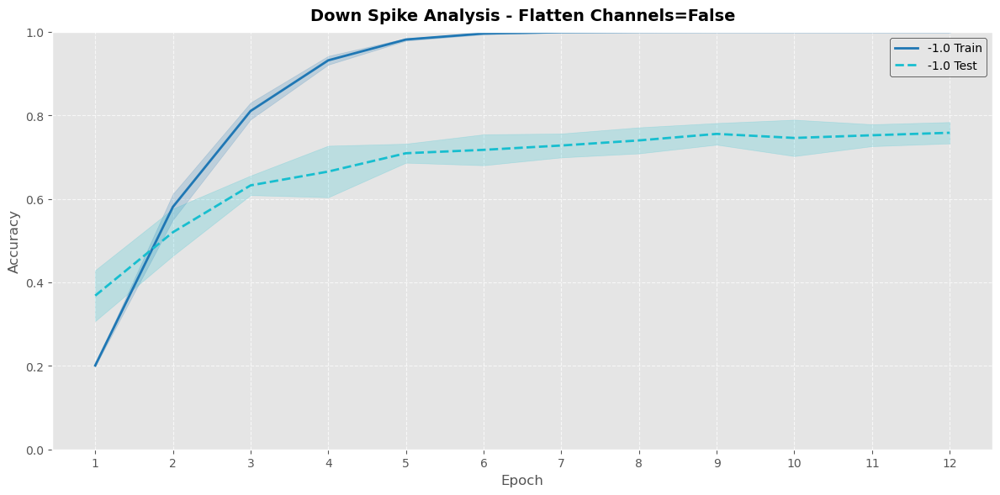

In [13]:
plot_convergence(
    "experiments/param_down_spike_20251212_1726.npz",
    "figures/plot_down_spike_single_channel.png",
    "Down Spike Analysis - Flatten Channels=False",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_down_spike_20251212_1726.npz",
    save_path="experiments/analysis_down_spike_flatten_False.txt"
)

Available keys in experiments/preprocessed_down_spike_20251021_2124.npz: ['-1.0', '1.0']
Table saved to experiments/analysis_down_spike_flatten_False.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
      -1.0                  1.0            0.823529                     1.0                0.77607
       1.0                  1.0            0.839572                     1.0                0.77607


### Num frames Experiment - DOWN spike +1.0

In [5]:
fixed_params = {"topn": None, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="num_frames",
    varying_values=[25, 10, 5],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for num_frames = 25 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 7

Available keys in experiments/preprocessed_num_frames_20251030_1549.npz: ['5', '10', '25']


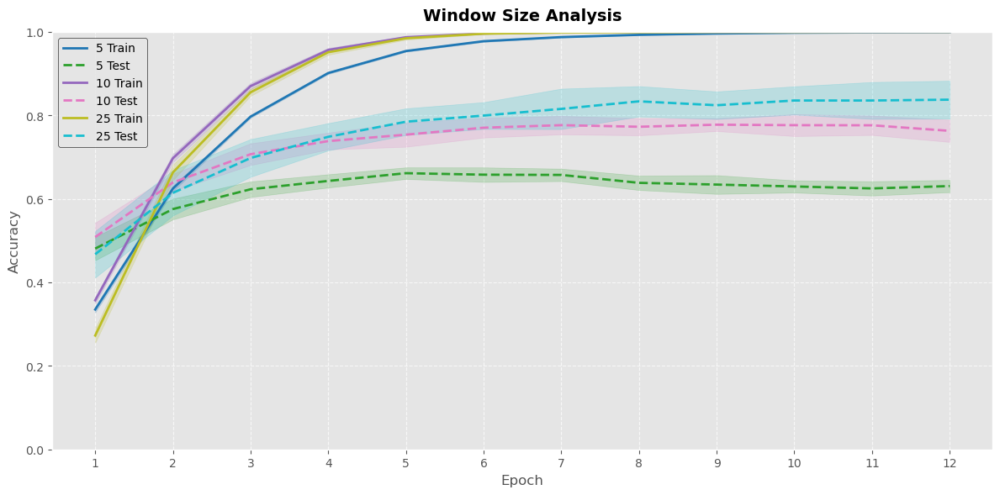

In [ ]:
plot_convergence(
    "experiments/param_num_frames_20251215_1220.npz",
    "figures/plot_num_frames_flatten_True.png",
    "Window Size Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_num_frames_20251215_1220.npz",
)

Available keys in experiments/preprocessed_num_frames_20251030_1549.npz: ['5', '10', '25']
Table saved to experiments/analysis_num_frames_flatten_True.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
         5             0.999847            0.681283                0.999274               0.630615
        10             1.000000            0.819172                0.999962               0.762877
        25             1.000000            0.893048                1.000000               0.837567


### Threshold experiment - Num frames 25

In [6]:
fixed_params = {"topn": None, "num_frames": 25, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70

Available keys in experiments/param_threshold_20251215_1235.npz: ['0.005', '0.01', '0.02']


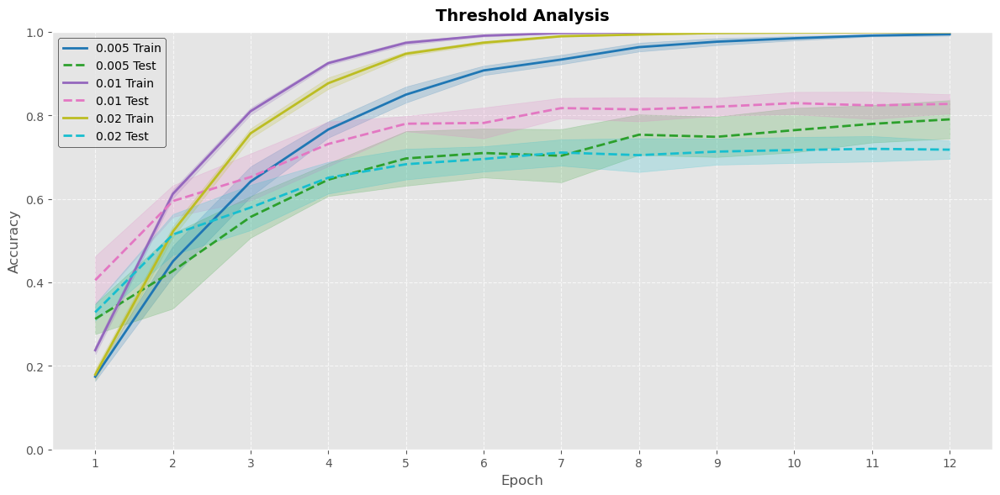

In [18]:
plot_convergence(
    "experiments/param_threshold_20251215_1235.npz",
    "figures/plot_threshold_25_frames_flatten_True.png",
    "Threshold Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251215_1235.npz",
)

Available keys in experiments/preprocessed_threshold_20251022_1130.npz: ['0.005', '0.01', '0.02']
Table saved to experiments/analysis_threshold_25_frames_flatten_True.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             0.987013            0.871658                0.977177               0.754011
      0.01             1.000000            0.903743                1.000000               0.848930
      0.02             1.000000            0.812834                0.999809               0.754011


### Threshold experiment - Num frames 10

In [7]:
fixed_params = {"topn": None, "num_frames": 10, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_None_num_frames_10_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_10_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 10, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176 176]
  - CV Test class distribution: [44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44 44]
Fold 2: CV Train samples = 2992, CV Test samples = 748
  - CV Train class distribution: [176 17

Available keys in experiments/param_threshold_20251215_1249.npz: ['0.005', '0.01', '0.02']


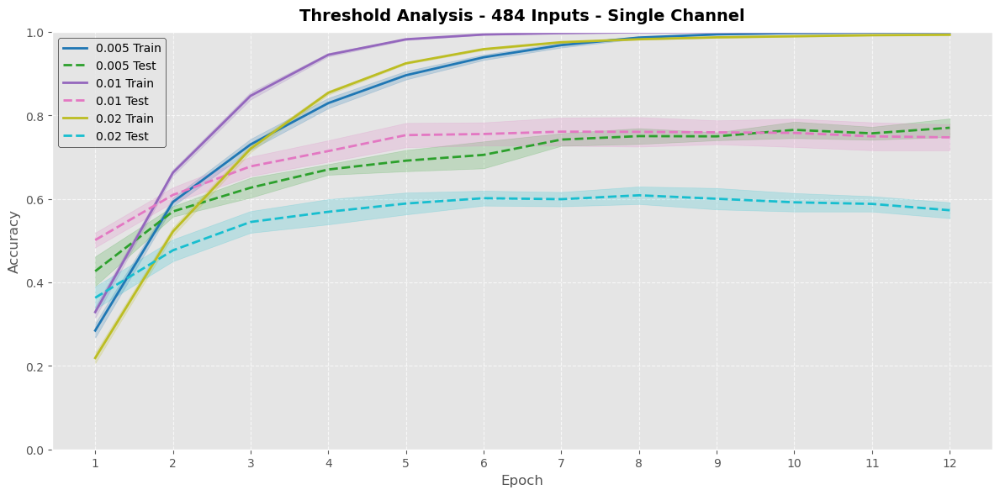

In [ ]:
plot_convergence(
    "experiments/param_threshold_20251215_1249.npz",
    "figures/plot_threshold_10_frames_flatten_True.png",
    "Threshold Analysis - 484 Inputs - Single Channel",
    plot_std=True
)

In [10]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251215_1249.npz",
)

Available keys in experiments/param_threshold_20251215_1249.npz: ['0.005', '0.01', '0.02']


TypeError: list indices must be integers or slices, not tuple

### Threshold experiment - Num frames 5

In [8]:
fixed_params = {"topn": None, "num_frames": 5, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01, 0.02],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_None_num_frames_5_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_5_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 5, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352 352]
  - CV Test class distribution: [88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88]
Fold 2: CV Train samples = 5984, CV Test samples = 1496
  - CV Train class distribution: [352 352

Available keys in experiments/param_threshold_20251215_1304.npz: ['0.005', '0.01', '0.02']


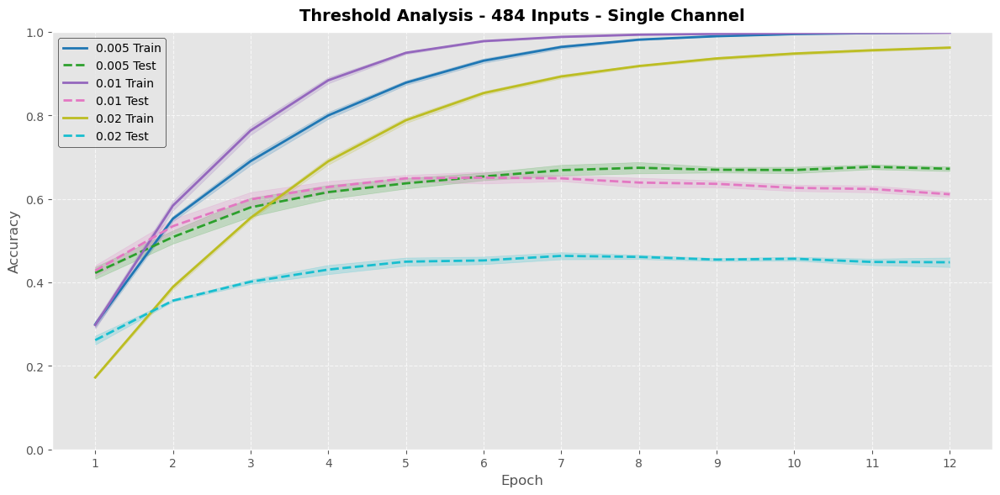

In [11]:
plot_convergence(
    "experiments/param_threshold_20251215_1304.npz",
    "experiments/plot_threshold_5_frames_flatten_True.png",
    "Threshold Analysis - 484 Inputs - Single Channel",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251215_1304.npz",
)

Available keys in experiments/preprocessed_threshold_20251022_1809.npz: ['0.005', '0.01', '0.02']
Table saved to experiments/analysis_threshold_5_frames_flatten_True.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     0.005             0.999666            0.713235                0.998864               0.695321
      0.01             0.999833            0.678476                0.999632               0.654278
      0.02             0.970755            0.499332                0.968817               0.440508


### Alpha experiment - Num frames 25

In [15]:
results = run_alpha_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="alpha_experiment",
    alpha_values=[0.1, 0.3, 0.5, 0.7, 0.9]
)

Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/alpha_experiment_20251215_1416.npz: ['0.1', '0.3', '0.5', '0.7', '0.9']


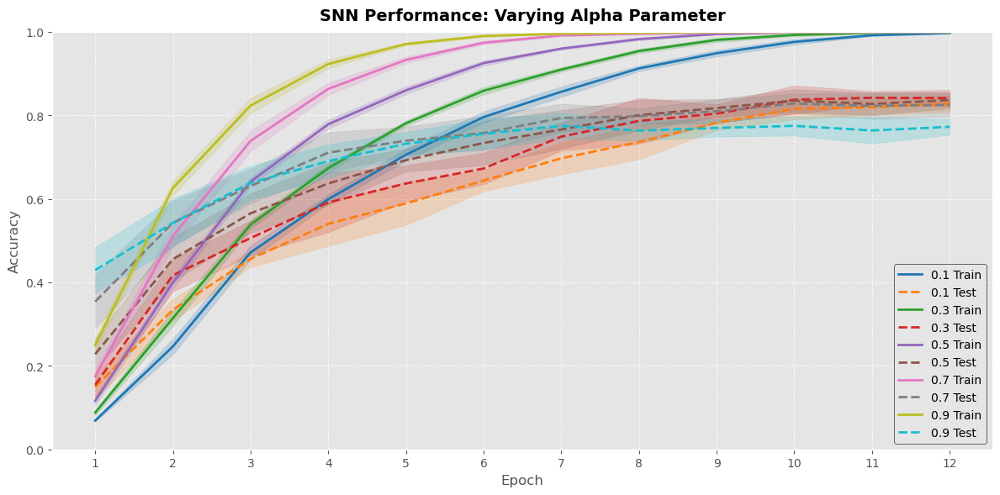

In [17]:
plot_convergence(
    file_path="experiments/alpha_experiment_20251215_1416.npz",
    save_path="figures/alpha_convergence.png",
    plt_title="SNN Performance: Varying Alpha Parameter",
    plot_std=True,
    include_keys=["0.1", "0.3", "0.5", "0.7", "0.9"]
)

### Alpha beta grid search

In [20]:
# Run GRID SWEEP (5×5 = 25 combinations)
results = run_alpha_beta_grid_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="alpha_beta_25_frames",
    alpha_values=[0.3, 0.5, 0.7],
    beta_values=[0.5, 0.7, 0.9]
)

Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

### Validation palm

In [22]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None, "session_id": [0, 1]}
results = final_training_and_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=2,
    alpha=0.7,
    beta=0.7,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
)


######################################################################
Starting final training from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.7911, Avg Train Accuracy: 21.66%
Epoch 1 - Avg Val Loss: 2.6826, Avg Val Accuracy: 37.50%
Epoch 2 - Avg Train Loss: 2.5517, Avg Train Accuracy: 60.09%
Epoch 2 - Avg Val Loss: 2.6159, Avg Val Accuracy: 47.79%
Epoch 3 - Avg Train Loss: 2.4172, Avg Train Accuracy: 80.28%
Epoch 3 - Avg Val Loss: 2.5761, Avg Val 

### [0,1] Session vs All sessions

In [23]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="session_id",
    varying_values=[[0, 1],[0,1,2,3,4]],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for session_id = [0, 1] from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 

Available keys in experiments/param_session_id_20251215_1514.npz: ['[0, 1]']


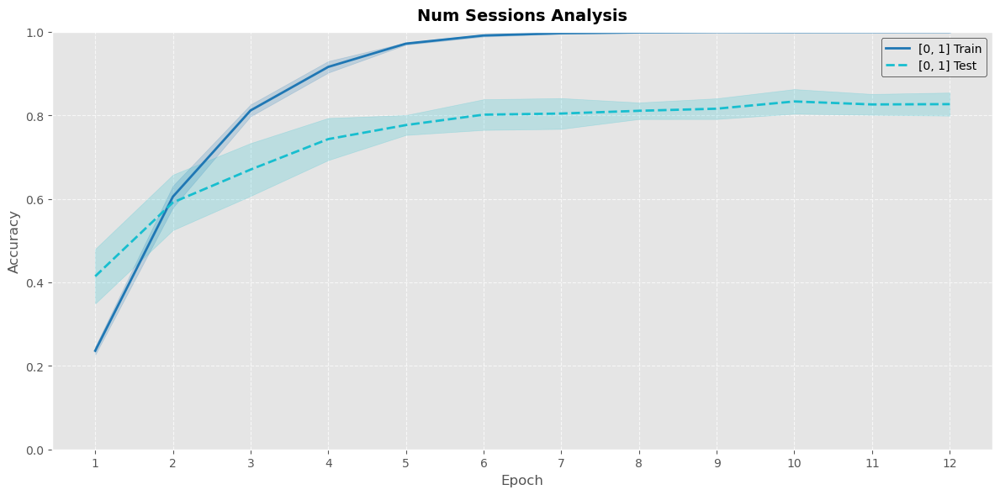

In [25]:
plot_convergence(
    "experiments/param_session_id_20251215_1514.npz",
    "figures/plot_session_id_25_frames_flatten_True.png",
    "Num Sessions Analysis",
    plot_std=True
)

In [ ]:
analyze_experiment_results(
    file_path="experiments/param_session_id_20251215_1514.npz",
    save_path="experiments/analysis_session_id_25_frames_flatten_True.txt"
)

Available keys in experiments/preprocessed_session_id_20251028_1200.npz: ['[0, 1]', '[0, 1, 2, 3, 4]']
Table saved to experiments/analysis_session_id_25_frames_flatten_True.txt

Experiment Results Table:
     Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
         [0, 1]                  1.0            0.882353                     1.0               0.831551
[0, 1, 2, 3, 4]                  1.0            0.859459                     1.0               0.800032


### Model experiment

In [2]:
results = run_model_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="model_experiment_results"
)

Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/model_experiment_results.npz: ['Synaptic', 'Synaptic_3', 'Synaptic_3_reduced']


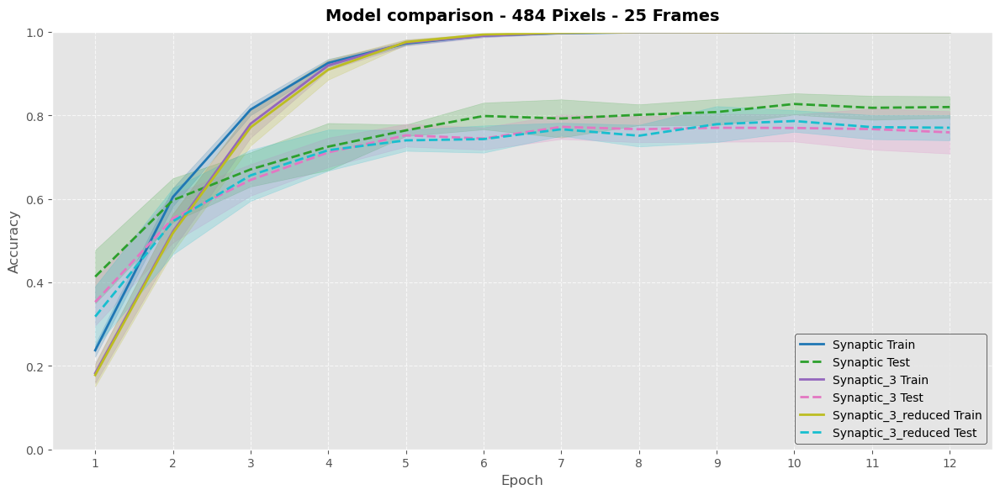

In [8]:
plot_convergence(
    "experiments/model_experiment_results.npz",
    "figures/model_experiment_results.png",
    "Model comparison - 484 Pixels - 25 Frames",
    plot_std=True
)

### Encoding experiment - single channel

In [4]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "rand_pixels": None, "session_id": [0, 1]}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["raw", "hybrid", "spike"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True
)

Skipping missing file: preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_raw_rand_pixels_None_session_id_0_1.pkl
Skipping missing file: preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_hybrid_rand_pixels_None_session_id_0_1.pkl

######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1:

KeyboardInterrupt: 

In [8]:
analysis = analyze_spike_counts_from_file(
    file_path="experiments/preprocessed_encoding_20251121_0959.npz",
    n=484,  # UP/DOWN neurons
    m=484   # Raw pressure neurons
)

For 'raw' encoding:
  Average spikes for raw neurons (last 484): 4576.78
For 'spike' encoding:
  Average spikes for spike neurons (first 484): 5698.64
For 'hybrid' encoding:
  Average spikes for spike neurons (first 484): 3471.32
  Average spikes for raw neurons (last 484): 2496.86


In [13]:
analyze_spikes(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
)


Spike Analysis – preprocessed_encoding_20251107_1512.npz
Varying values: ['raw', 'hybrid', 'spike']

--- raw ---
Total hidden spikes          : 697734.0
Spikes per fold (first 8)    : [13123.0, 16194.0, 15326.0, 20985.0, 15279.0, 11198.0, 17292.0, 10688.0] …
Hidden spikes array shape    : (1496, 25, 1452)
Avg spikes per test sample   : 466.40 ± 403.13
Avg firing rate per neuron   : 0.01285 ± 0.01106
---------------------------------------------

--- hybrid ---
Total hidden spikes          : 804960.0
Spikes per fold (first 8)    : [18201.0, 17855.0, 18243.0, 18243.0, 17644.0, 16692.0, 17636.0, 17073.0] …
Hidden spikes array shape    : (1496, 25, 2904)
Avg spikes per test sample   : 538.07 ± 128.63
Avg firing rate per neuron   : 0.00741 ± 0.02007
---------------------------------------------

--- spike ---
Total hidden spikes          : 855087.0
Spikes per fold (first 8)    : [22169.0, 21687.0, 21815.0, 21958.0, 21141.0, 20017.0, 21238.0, 20567.0] …
Hidden spikes array shape    : (1496,

In [14]:
analyze_membrane(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
)


=== MEMBRANE DIAGNOSTICS ===
encoding  max_mem (fold max)  mean_mem (fold avg) % mem > 0.5 max_mem / sample  spikes total
     raw              7.2136              -0.2057      17.55%            1.972   697734.0000
  hybrid             89.2796              -4.4650       2.43%           33.665   804960.0000
   spike            102.1031              -4.7072       3.88%           37.319   855087.0000

Interpretation:
  • If max_mem < 1.0 → NO SPIKES → NO LEARNING
  • Raw data typically shows max_mem ≈ 0.2–0.4
  • Spike-encoded data shows max_mem ≈ 1.5–3.0



Plotting raw: 1496 samples, 25 time steps, 1452 hidden neurons
Selected neurons: [605 862 796]


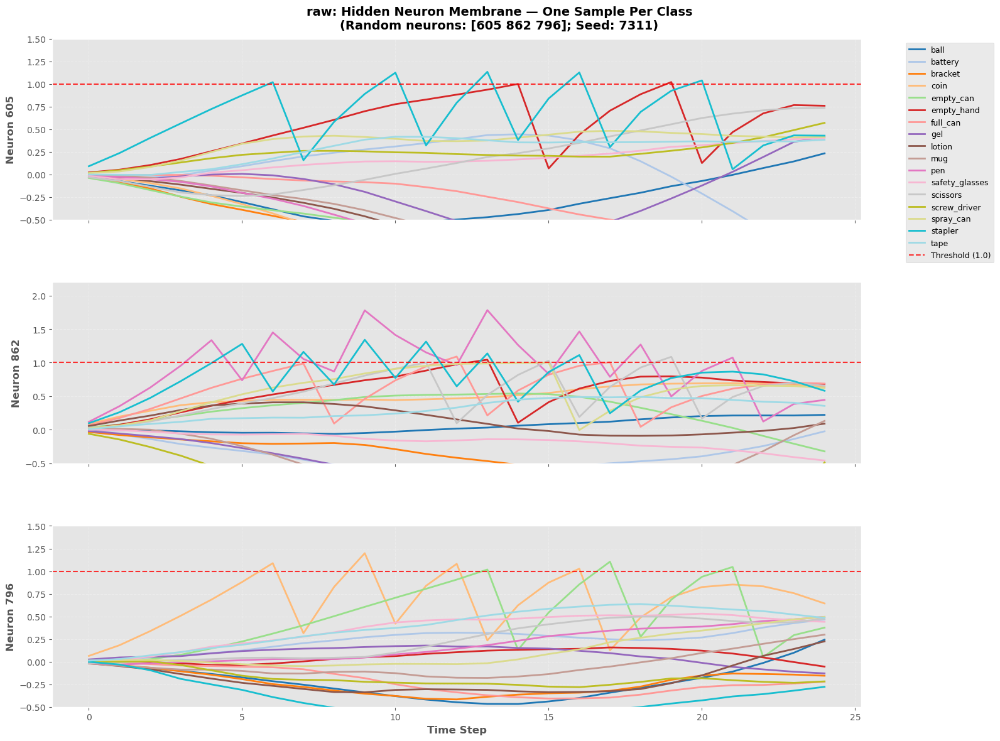


Plotting hybrid: 1496 samples, 25 time steps, 2904 hidden neurons
Selected neurons: [1963  268  348]


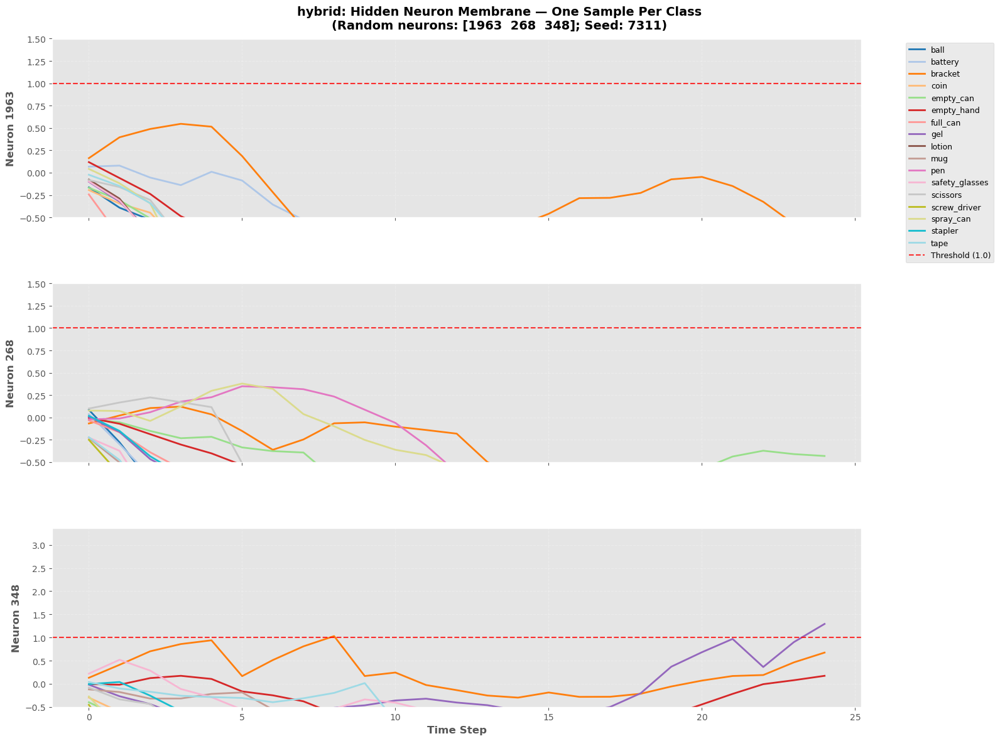


Plotting spike: 1496 samples, 25 time steps, 1452 hidden neurons
Selected neurons: [1256  514 1395]


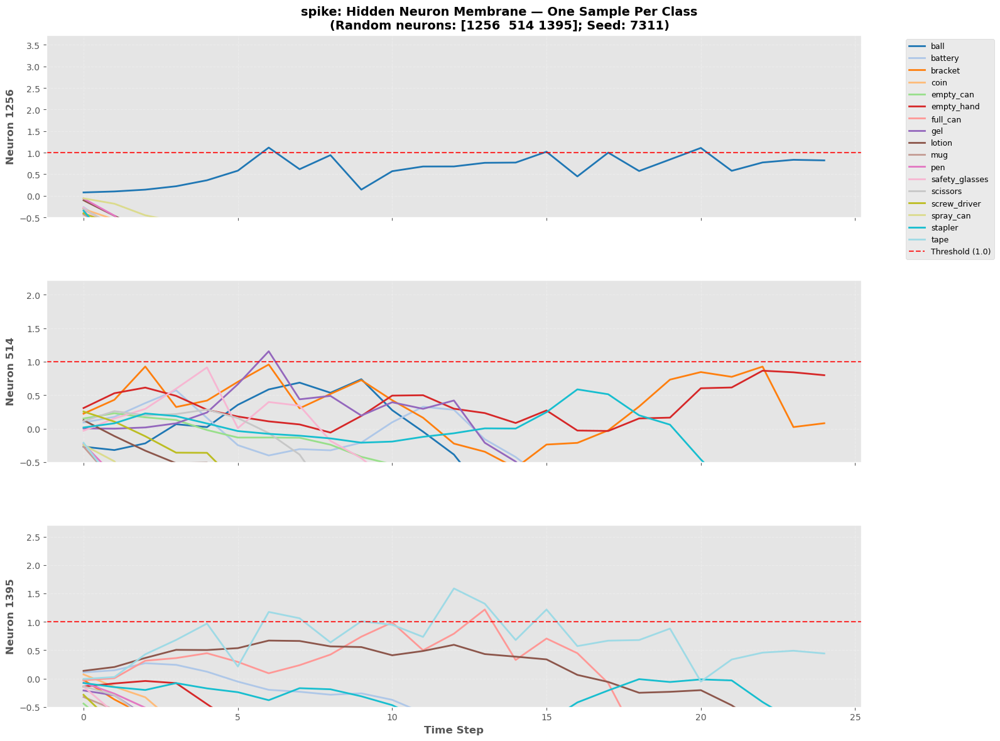

In [27]:
plot_membrane_one_per_class(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
)

Available keys in experiments/preprocessed_encoding_20251107_1512.npz: ['raw', 'hybrid', 'spike']


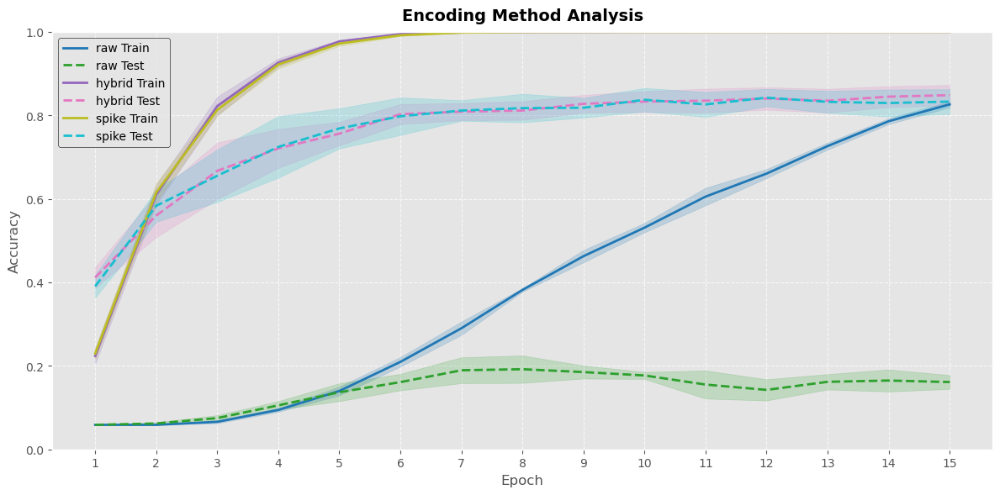

In [6]:
plot_convergence(
    "experiments/preprocessed_encoding_20251107_1512.npz",
    "experiments/plot_encoding_flatten_True.png",
    "Encoding Method Analysis",
    plot_std=True
)

In [29]:
analyze_experiment_results(
    file_path="experiments/preprocessed_encoding_20251107_1512.npz",
    save_path="experiments/analysis_encoding_flatten_True_topn_200.txt"
)

Available keys in experiments/preprocessed_encoding_20251107_1512.npz: ['raw', 'hybrid', 'spike']
Table saved to experiments/analysis_encoding_flatten_True_topn_200.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
       raw               0.8360              0.2457                  0.8263                 0.1613
    hybrid               1.0000              0.8791                  1.0000                 0.8483
     spike               1.0000              0.8693                  1.0000                 0.8329


### Encoding experiment - double channel

In [ ]:
fixed_params = {"topn": None, "threshold": 0.01, "num_frames": 25, "session_id": [0, 1], "flatten_channels": False, "down_spike": -1.0}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["spike", "hybrid", "raw"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True
)


######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_False_down_spike_-1.0_encoding_spike_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_False_down_spike_-1.0_encoding_spike_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'flatten_channels': False, 'down_spike': -1.0, 'encoding': 'spike'}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 7

In [31]:
analyze_spikes(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
)


Spike Analysis – preprocessed_encoding_20251107_1637.npz
Varying values: ['spike', 'hybrid', 'raw']

--- spike ---
Total hidden spikes          : 750204.0
Spikes per fold (first 8)    : [14823.0, 14828.0, 14778.0, 15707.0, 14920.0, 14112.0, 14803.0, 14003.0] …
Hidden spikes array shape    : (1496, 25, 2904)
Avg spikes per test sample   : 501.47 ± 110.76
Avg firing rate per neuron   : 0.00691 ± 0.02023
---------------------------------------------

--- hybrid ---
Total hidden spikes          : 713087.0
Spikes per fold (first 8)    : [16774.0, 16326.0, 16803.0, 17892.0, 16861.0, 16223.0, 16242.0, 15446.0] …
Hidden spikes array shape    : (1496, 25, 4356)
Avg spikes per test sample   : 476.66 ± 118.55
Avg firing rate per neuron   : 0.00438 ± 0.01557
---------------------------------------------

--- raw ---
Total hidden spikes          : 688323.0
Spikes per fold (first 8)    : [12389.0, 15674.0, 14705.0, 20116.0, 14729.0, 10633.0, 16662.0, 10223.0] …
Hidden spikes array shape    : (1496,

In [32]:
analyze_membrane(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
)


=== MEMBRANE DIAGNOSTICS ===
encoding  max_mem (fold max)  mean_mem (fold avg) % mem > 0.5 max_mem / sample  spikes total
   spike             82.3377              -4.2340       2.49%           31.230   750204.0000
  hybrid             67.3334              -4.4496       1.92%           31.149   713087.0000
     raw              7.1420              -0.2029      18.17%            2.003   688323.0000

Interpretation:
  • If max_mem < 1.0 → NO SPIKES → NO LEARNING
  • Raw data typically shows max_mem ≈ 0.2–0.4
  • Spike-encoded data shows max_mem ≈ 1.5–3.0



Plotting spike: 1496 samples, 25 time steps, 2904 hidden neurons
Selected neurons: [2442 2543 1258]


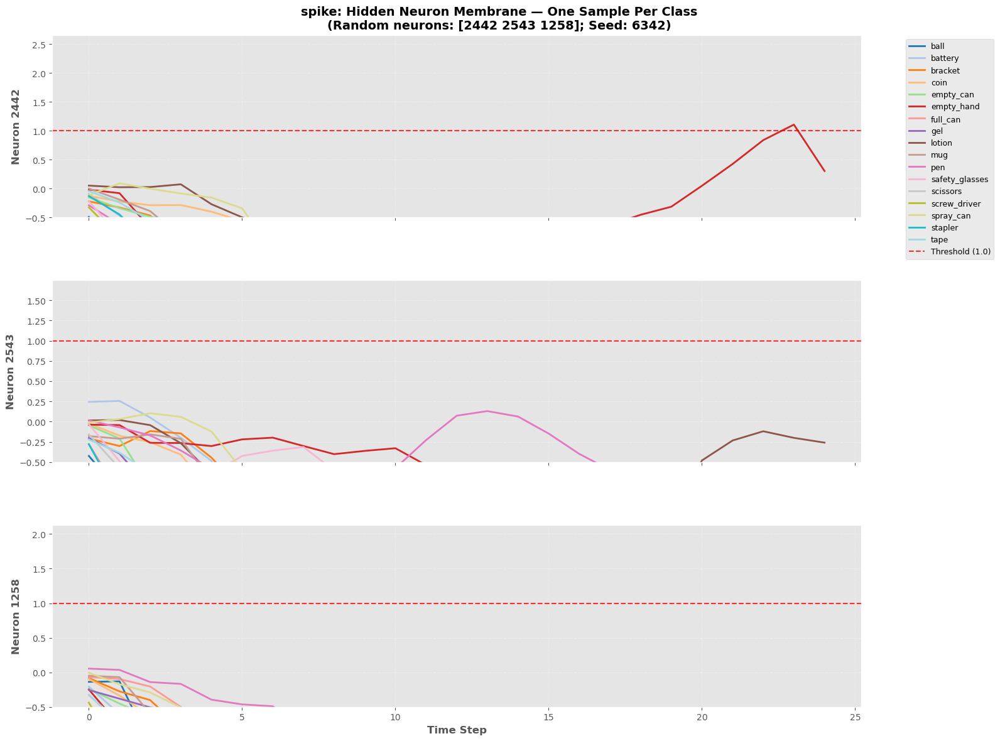


Plotting hybrid: 1496 samples, 25 time steps, 4356 hidden neurons
Selected neurons: [2619 2142 1970]


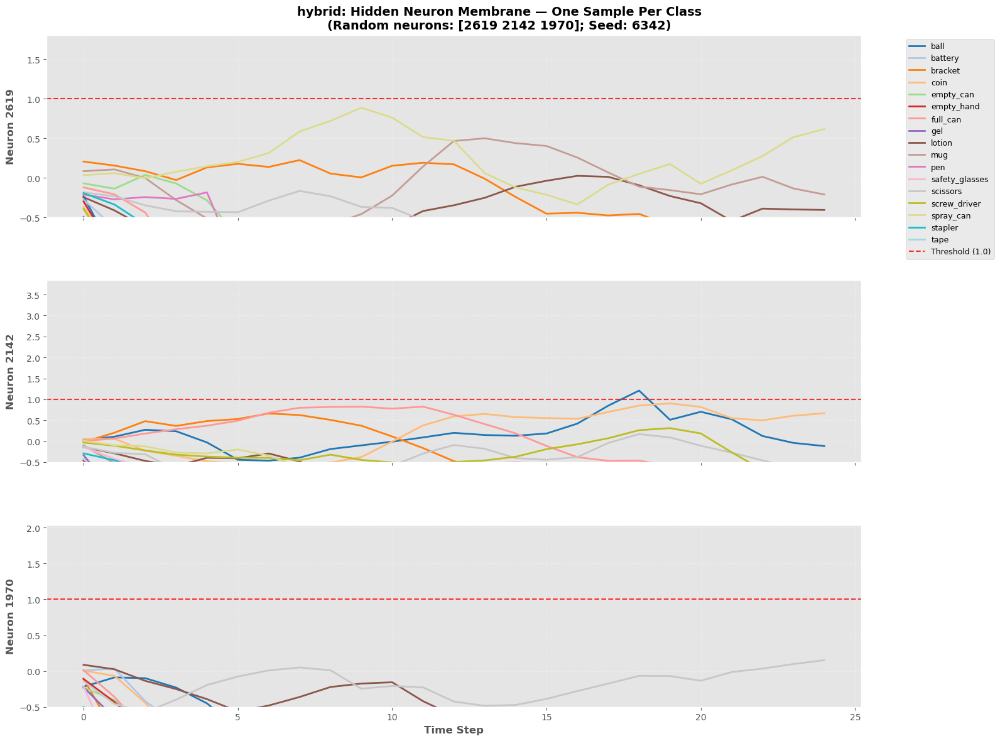


Plotting raw: 1496 samples, 25 time steps, 1452 hidden neurons
Selected neurons: [ 969 1168  132]


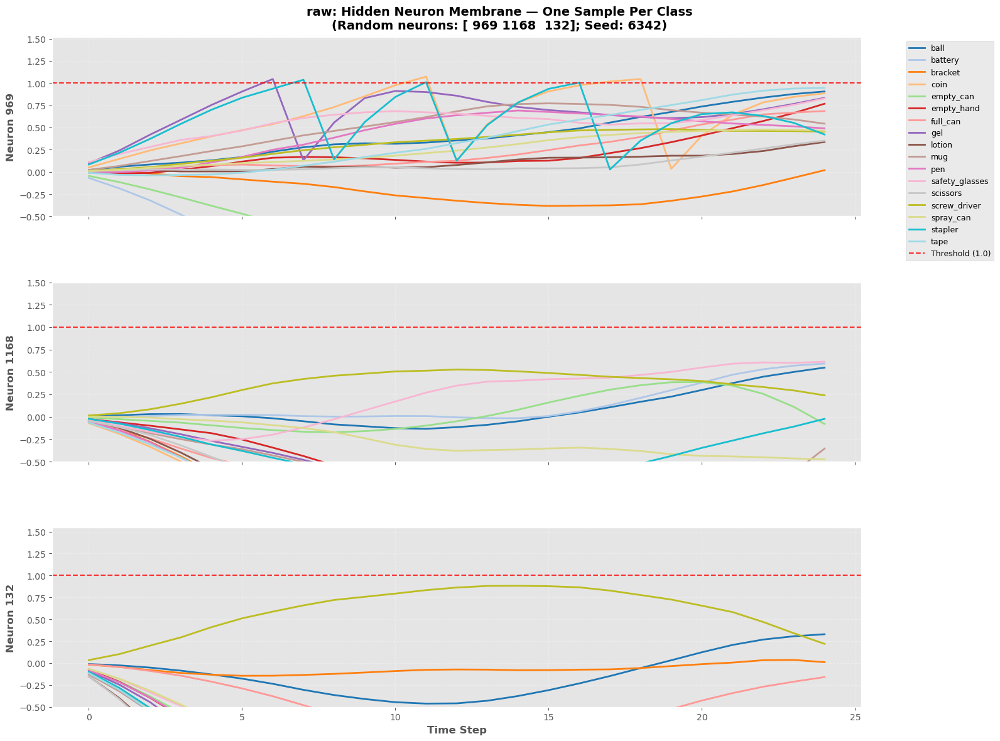

In [34]:
plot_membrane_one_per_class(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
)

Available keys in experiments/preprocessed_encoding_20251107_1637.npz: ['spike', 'hybrid', 'raw']


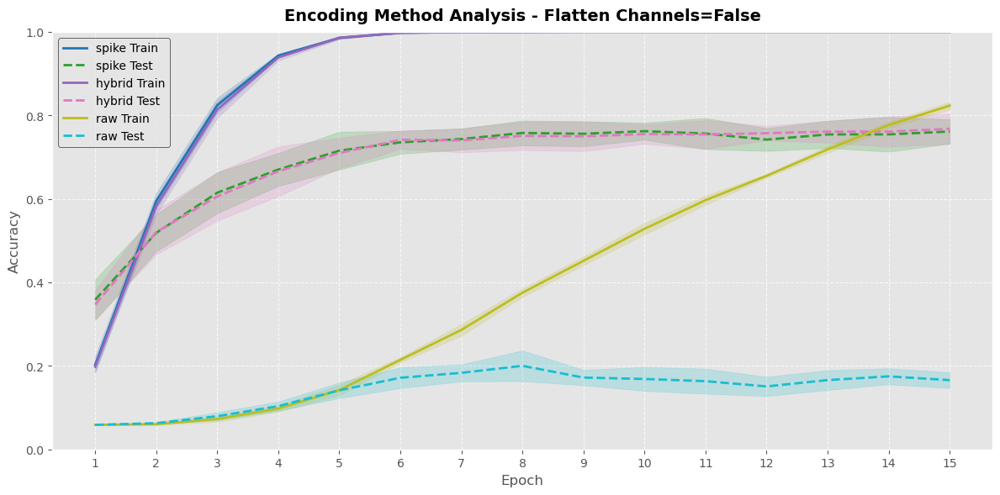

In [ ]:
plot_convergence(
    "experiments/preprocessed_encoding_20251107_1637.npz",
    "experiments/plot_encoding_flatten_False.png",
    "Encoding Method Analysis - Using 484 Pixels - Dual Channel",
    plot_std=True
)

In [36]:
analyze_experiment_results(
    file_path="experiments/preprocessed_encoding_20251107_1637.npz",
    save_path="experiments/analysis_encoding_flatten_True_topn_200.txt"
)

Available keys in experiments/preprocessed_encoding_20251107_1637.npz: ['spike', 'hybrid', 'raw']
Table saved to experiments/analysis_encoding_flatten_True_topn_200.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
     spike               1.0000              0.8137                  1.0000                 0.7613
    hybrid               1.0000              0.8203                  1.0000                 0.7677
       raw               0.8378              0.2422                  0.8234                 0.1658


### Sparsity experiment

In [5]:
results = run_sparsity_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="sparsity_experiment",
    alpha=0.7,
    beta=0.7,
    sparsity_values=[0.2, 0.4, 0.5, 0.6, 0.8, 1.0],
    return_weights=True
)

Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 1

Available keys in experiments/sparsity_experiment_20251215_1648.npz: ['0.2', '0.4', '0.5', '0.6', '0.8', '1.0']


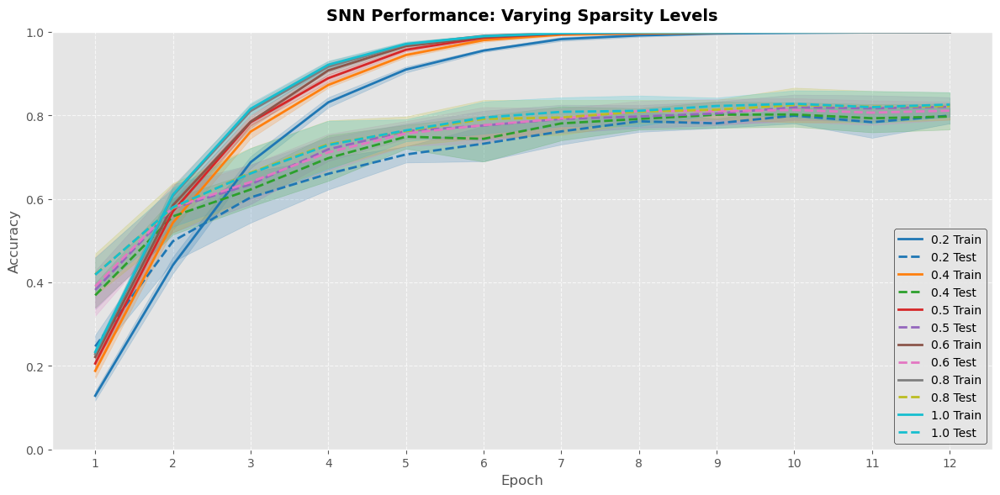

In [7]:
plot_convergence(
    file_path="experiments/sparsity_experiment_20251215_1648.npz",
    save_path="figures/sparsity_convergence.png",
    plt_title="SNN Performance: Varying Sparsity Levels",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/sparsity_experiment_20251215_1648.npz",
    save_path="experiments/analysis_sparsity_experiment.txt"
)

Available keys in experiments/sparsity_experiment_20251202_162825.npz: ['0.2', '0.4', '0.5', '0.6', '0.8', '1.0']
Table saved to experiments/analysis_sparsity_experiment.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
       0.2                  1.0            0.823529                     1.0               0.778547
       0.4                  1.0            0.843137                     1.0               0.800769
       0.5                  1.0            0.856209                     1.0               0.813802
       0.6                  1.0            0.846405                     1.0               0.796194
       0.8                  1.0            0.866013                     1.0               0.815302
       1.0                  1.0            0.856209                     1.0               0.804652


In [ ]:
analyze_weights(
    file_path="experiments/sparsity_experiment_20251215_1648.npz",
)

Loaded: sparsity_experiment_20251202_162825.npz
Found 6 configurations


           INPUT → HIDDEN LAYER WEIGHT ANALYSIS
Config Intended Keep Actual Keep Actual Zero Leakage (%) Avg |W| (all) Avg |W| (nonzero) Total Synapses
   0.2          0.20      0.2001      0.7999       0.00%       0.00781           0.03902        702,768
   0.4          0.40      0.4001      0.5999       0.00%       0.01380           0.03450        702,768
   0.5          0.50      0.5002      0.4998       0.00%       0.01673           0.03345        702,768
   0.6          0.60      0.6002      0.3998       0.00%       0.01951           0.03250        702,768
   0.8          0.80      0.7997      0.2003       0.03%       0.02494           0.03119        702,768
   1.0          1.00      1.0000      0.0000       0.00%       0.03022           0.03022        702,768

Interpretation:
  • Intended Keep = density used during training (e.g. 0.40 = 40% connections kept)
  • Actual Zero ≈ Intended Zero → mask was perfect

### Top-1 / Top-3 experiment on entire dataset

In [13]:
fixed_params = {"topn": None, "threshold": 0.01, "num_frames": 25, "session_id": [0, 1, 2, 3, 4], "channels": 1, "down_spike": 1.0, "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["spike"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True,
    topk_accuracy=3
)


######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1_2_3_4.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1_2_3_4.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1, 2, 3, 4], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 2720, CV Test samples = 680
  - CV Train class distribution: [160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160]
  - CV Test class distribution: [40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40]
Fold 2: CV Train samples = 2720, CV Test samples = 680
  - CV Train class dist

Bar plot saved to figures/topk_bar.png


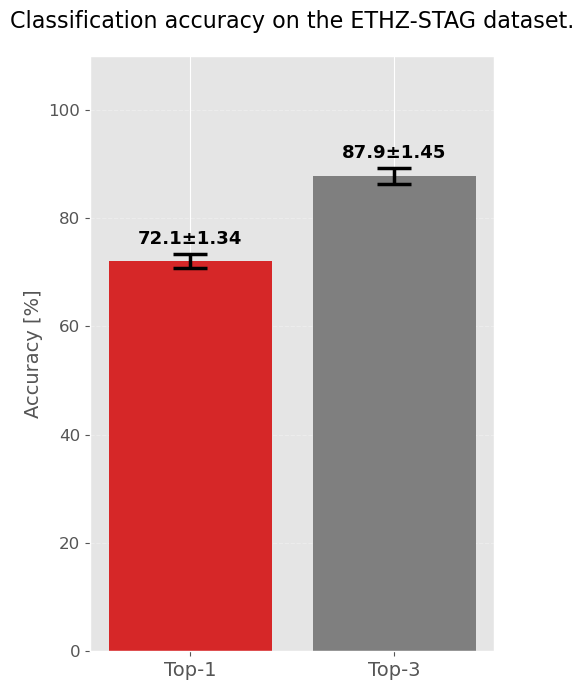

{'top1_mean': 72.08823529411765,
 'top1_std': 1.3394467690277279,
 'top3_mean': 87.85294117647058,
 'top3_std': 1.45461917869156}

In [14]:
plot_topk_accuracy_bar(
    "experiments/param_encoding_20251215_1707.npz",
    save_path="figures/topk_bar.png",
    title="Classification accuracy on the ETHZ-STAG dataset."
)

### Top-1 / Top-3 experiment on Sessions 0 and 1

In [16]:
fixed_params = {"topn": None, "threshold": 0.01, "num_frames": 25, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="encoding",
    varying_values=["spike"],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7,
    return_membrane=True,
    return_spikes=True,
    topk_accuracy=3
)


######################################################################
Running experiment for encoding = spike from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 

Bar plot saved to figures/topk_bar.png


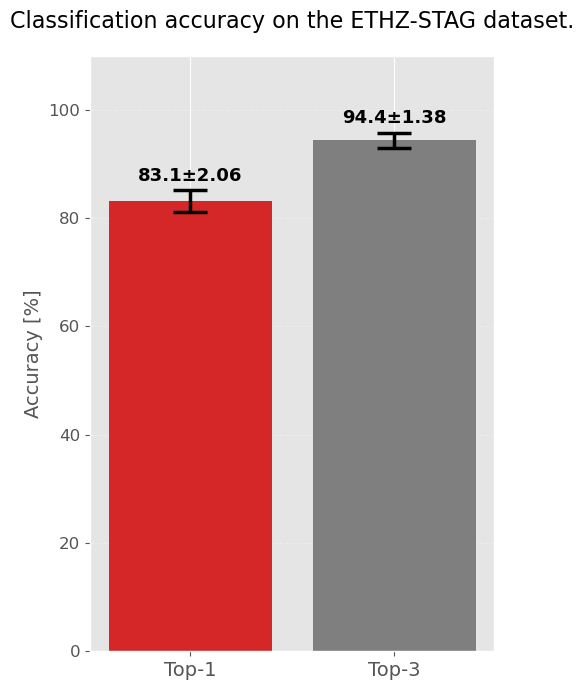

{'top1_mean': 83.12572087658592,
 'top1_std': 2.0560350592993926,
 'top3_mean': 94.42522106881968,
 'top3_std': 1.3758888542972667}

In [17]:
plot_topk_accuracy_bar(
    "experiments/param_encoding_20251215_1712.npz",
    save_path="figures/topk_bar.png",
    title="Classification accuracy on the ETHZ-STAG dataset."
)

## TOPN PIXELS

### TOPN experiment - Num frames 25 - Threshold 0.01 - alpha = beta = 0.7

In [22]:
fixed_params = {"topn": None, "threshold": 0.01, "num_frames": 25, "session_id": [0, 1], "channels": 1, "encoding": "spike", "down_spike": 1.0, "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="topn",
    varying_values=[100, 200, 300, 400],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for topn = 100 from preprocessed_data/spike_data_topn_100_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_100_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 100, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 

Available keys in experiments/param_topn_20251215_1737.npz: ['100', '200', '300', '400']


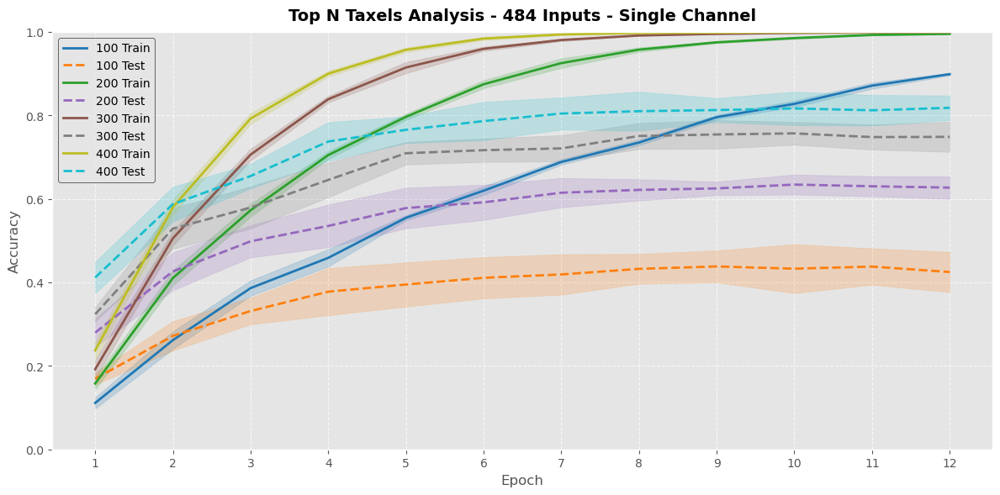

In [25]:
plot_convergence(
    "experiments/param_topn_20251215_1737.npz",
    "figures/plot_topn_flatten_True_25_frames.png",
    "Top N Taxels Analysis - 484 Inputs - Single Channel",
    plot_std=True
)

### Alpha beta grid search - TOPN = 300

In [5]:
# Run GRID SWEEP (5×5 = 25 combinations)
results = run_alpha_beta_grid_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=16,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="alpha_beta_topn_300_25_frames",
    alpha_values=[0.3, 0.5, 0.7],
    beta_values=[0.5, 0.7, 0.9]
)

Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

### Alpha beta grid search - TOPN = 200

In [ ]:
# Run GRID SWEEP (5×5 = 25 combinations)
results = run_alpha_beta_grid_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    num_outputs=17,
    num_inputs=484,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="alpha_beta_topn_200_25_frames",
    alpha_values=[0.3, 0.5, 0.7],
    beta_values=[0.5, 0.7, 0.9]
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

## TOPN = 300

### Threshold experiment - TOPN = 300

In [2]:
fixed_params = {"topn": 300, "num_frames": 25, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="threshold",
    varying_values=[0.005, 0.01],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.7
)


######################################################################
Running experiment for threshold = 0.005 from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.005_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.005, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70

Available keys in experiments/param_threshold_20251216_1220.npz: ['0.005', '0.01']


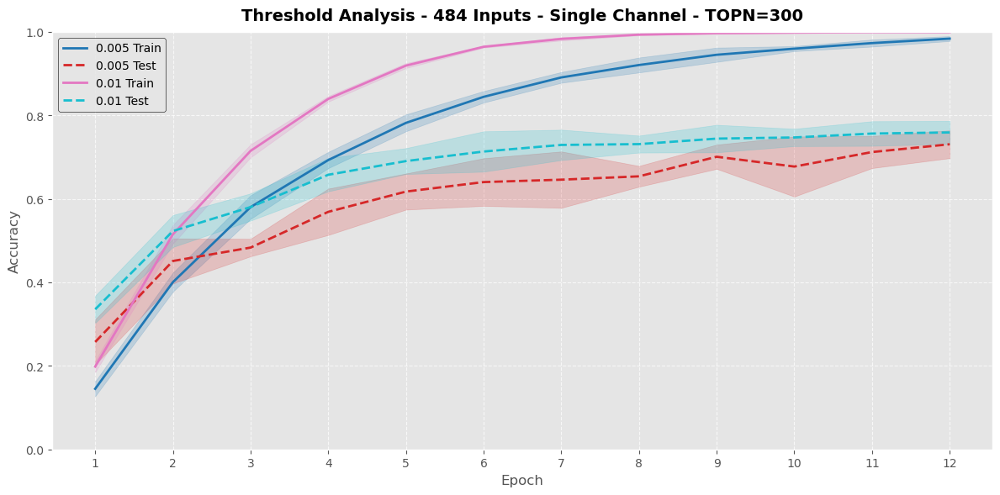

In [3]:
plot_convergence(
    "experiments/param_threshold_20251216_1220.npz",
    "figures/plot_threshold_flatten_True_topn_300.png",
    "Threshold Analysis - 484 Inputs - Single Channel - TOPN=300",
    plot_std=True
)

In [4]:
analyze_experiment_results(
    file_path="experiments/param_threshold_20251216_1220.npz",
)

Available keys in experiments/param_threshold_20251216_1220.npz: ['0.005', '0.01']


TypeError: list indices must be integers or slices, not tuple

### Validation best hyperparameters TOPN = 300

In [7]:
fixed_params = {"topn": 300, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "down_spike": 1.0, "channels": 1, "encoding": "spike", "rand_pixels": None}
results = final_training_and_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=1,
    verbose=True,
    patience=4,
    min_delta=0.01,
    loss_fn='combined',
    alpha=0.7,
    beta=0.7,
    lr=0.001    
)


######################################################################
Starting final training from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8058, Avg Train Accuracy: 18.72%
Epoch 1 - Avg Val Loss: 2.7102, Avg Val Accuracy: 33.82%
Epoch 2 - Avg Train Loss: 2.6208, Avg Train Accuracy: 51.87%
Epoch 2 - Avg Val Loss: 2.6624, Avg Val Accuracy: 47.06%
Epoch 3 - Avg Train Loss: 2.4823, Avg Train Accuracy: 70.86%
Epoch 3 - Avg Val Loss: 2.6125, Avg Val Acc

## TOPN = 200

### Validation best hyperparameters TOPN = 200

In [8]:
fixed_params = {"topn": 200, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "down_spike": 1.0, "channels": 1, "encoding": "spike", "rand_pixels": None}
results = final_training_and_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    lr=0.001,
    loss_fn='combined'
)


######################################################################
Starting final training from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Epoch 1 - Avg Train Loss: 2.8377, Avg Train Accuracy: 16.84%
Epoch 1 - Avg Val Loss: 2.7794, Avg Val Accuracy: 38.24%
Epoch 2 - Avg Train Loss: 2.7208, Avg Train Accuracy: 44.52%
Epoch 2 - Avg Val Loss: 2.7287, Avg Val Accuracy: 33.82%
Epoch 3 - Avg Train Loss: 2.6185, Avg Train Accuracy: 62.70%
Epoch 3 - Avg Val Loss: 2.7819, Avg Val Acc

### Finetuning best hyperparamaters TOPN = 200

In [2]:
results = run_finetuning(
    fixed_params={"topn": 200, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None},
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    fine_tune_epochs=20,
    alpha=0.5,
    beta=0.9,
)


######################################################################
Running fine-tuning experiment with fixed parameters from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70

### Confusion matrix - TOPN = 200

In [4]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

### Validation TOPN = 200 - 10 classes

In [5]:
fixed_params = {"topn": 200, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "down_spike": 1.0, "channels": 1, "encoding": "spike", "rand_pixels": None}
results = final_training_and_validation(
    device=device,
    fixed_params=fixed_params,
    num_epochs=20,
    batch_size=1,
    alpha=0.5,
    beta=0.9,
    verbose=True,
    patience=5,
    min_delta=0.01,
    loss_fn='combined',
    lr=0.001,
    include_classes=['spray_can', 'lotion', 'safety_glasses', 'empty_hand', 'screw_driver', 'ball', 'mug', 'pen', 'full_can', 'scissors']
)


######################################################################
Starting final training from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping only classes: ['ball', 'empty_hand', 'full_can', 'lotion', 'mug', 'pen', 'safety_glasses', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Epoch 1 - Avg Train Loss: 2.2900, Avg Train Accuracy: 29.66%
Epoch 1 - Avg Val Loss: 2.1597, Avg Val Accuracy: 52.50%
Epoch 2 - Avg Train Loss: 2.1317, Avg Train Accuracy: 64.20%
Epoch 2 - Avg 

### [0,1] Session vs All sessions

In [6]:
fixed_params = {"topn": 200, "num_frames": 25, "threshold": 0.01, "channels": 1, "down_spike": 1.0, "encoding": "spike", "rand_pixels": None}
results_num_frames = run_param_experiment(
    varying_param="session_id",
    varying_values=[[0, 1],[0,1,2,3,4]],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
)


######################################################################
Running experiment for session_id = [0, 1] from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 

Available keys in experiments/param_session_id_20251216_1439.npz: ['[0, 1]', '[0, 1, 2, 3, 4]']


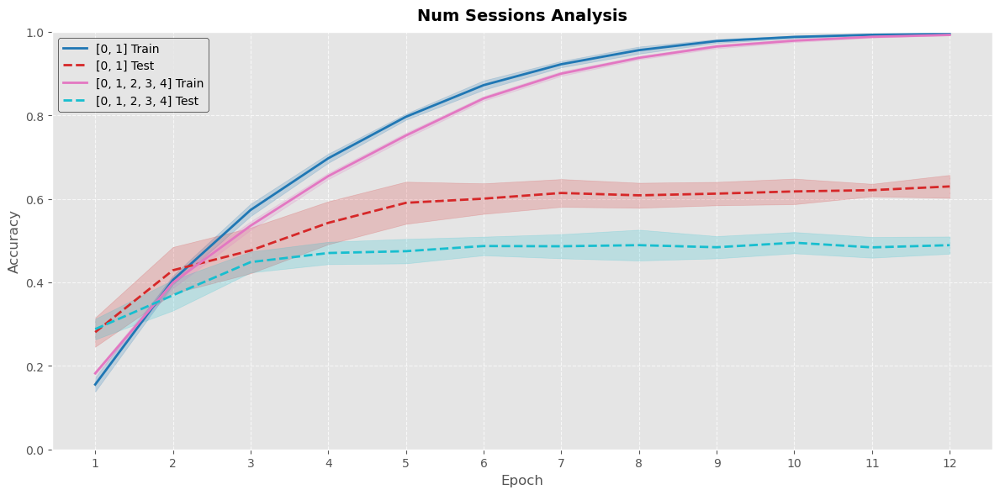

In [8]:
plot_convergence(
    "experiments/param_session_id_20251216_1439.npz",
    "figures/plot_session_id_25_frames_flatten_True_200_pixels.png",
    "Num Sessions Analysis",
    plot_std=True
)

In [9]:
analyze_experiment_results(
    file_path="experiments/param_session_id_20251216_1439.npz",
)

Available keys in experiments/param_session_id_20251216_1439.npz: ['[0, 1]', '[0, 1, 2, 3, 4]']


TypeError: list indices must be integers or slices, not tuple

### Model experiment

In [7]:
results = run_model_experiment(
    device=device,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="model_experiment_results_200_pixels"
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

Available keys in experiments/model_experiment_results_200_pixels.npz: ['Synaptic', 'Synaptic_3', 'Synaptic_3_reduced']


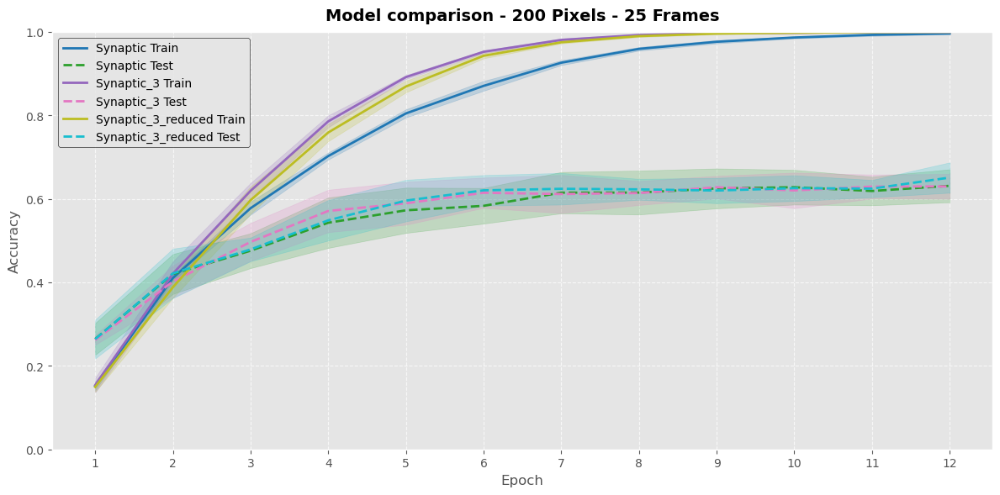

In [10]:
plot_convergence(
    "experiments/model_experiment_results_200_pixels.npz",
    "experiments/model_experiment_results_200_pixels.png",
    "Model comparison - 200 Pixels - 25 Frames",
    plot_std=True
)

### Sparsity experiment

In [15]:
results = run_sparsity_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=16,
    verbose=True,
    num_outputs=17,
    num_inputs=200,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    output_name="sparsity_experiment_topn_200",
    alpha=0.5,
    beta=0.9,
    sparsity_values=[0.2, 0.4, 0.5, 0.6, 0.8, 1.0],
    return_weights=True
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

Available keys in experiments/sparsity_experiment_topn_200_20251216_1552.npz: ['0.2', '0.4', '0.5', '0.6', '0.8', '1.0']


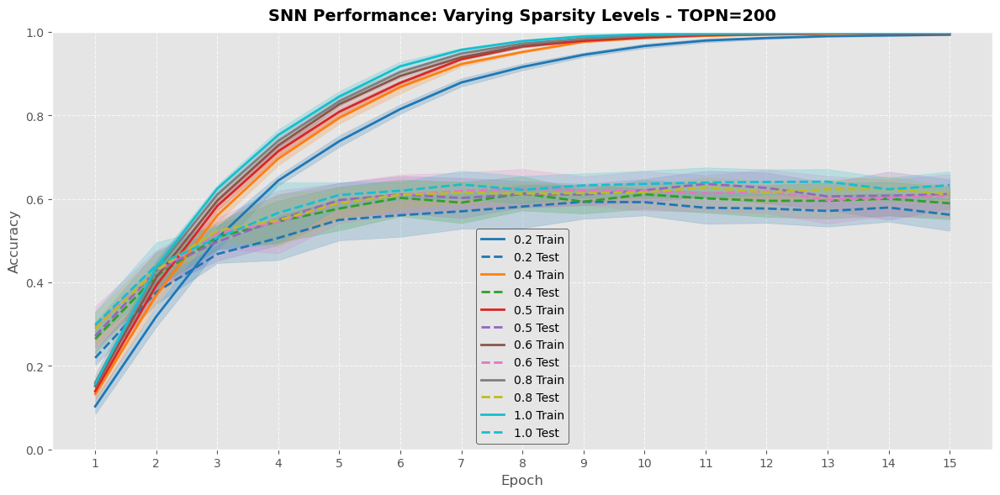

In [17]:
plot_convergence(
    file_path="experiments/sparsity_experiment_topn_200_20251216_1552.npz",
    save_path="figures/sparsity_topn_200.png",
    plt_title="SNN Performance: Varying Sparsity Levels - TOPN=200",
    plot_std=True
)

### Fan in experiment

In [2]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=16,
    verbose=True,
    num_outputs=17,
    num_inputs=200,
    input_file="spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[16, 32, 64, 128, 200],
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Using all 17 classes
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 

Available keys in experiments/fan_in_20251216_1637.npz: ['fanin_16', 'fanin_32', 'fanin_64', 'fanin_128', 'fanin_200']


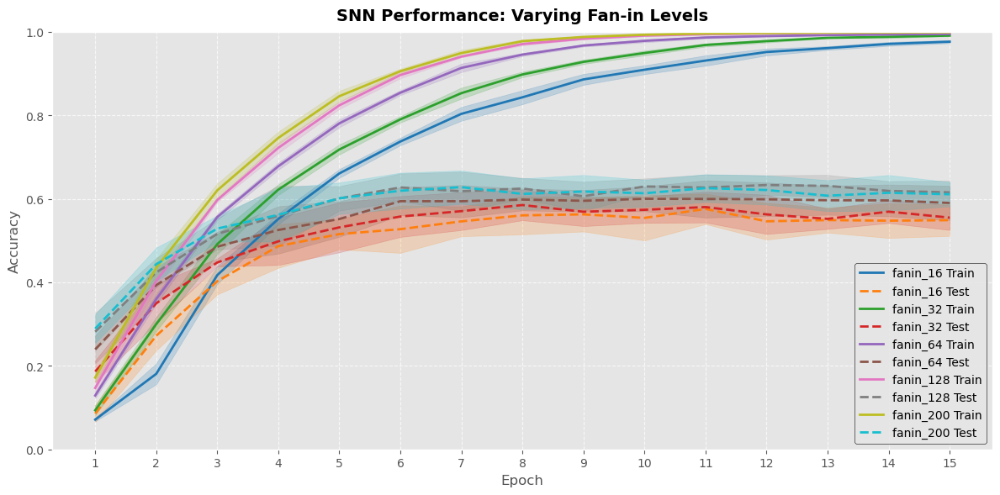

In [3]:
plot_convergence(
    file_path="experiments/fan_in_20251216_1637.npz",
    save_path="figures/fanin_convergence.png",
    plt_title="SNN Performance: Varying Fan-in Levels",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_20251216_1637.npz",
)

Available keys in experiments/fanin_experiment_20251204_160753.npz: ['fanin_16', 'fanin_32', 'fanin_64', 'fanin_128', 'fanin_200']
Table saved to experiments/analysis_fanin_experiment.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
  fanin_16             0.981513            0.647059                0.976624               0.539331
  fanin_32             0.991715            0.633987                0.991308               0.556824
  fanin_64             0.999160            0.673203                0.996833               0.588312
 fanin_128             1.000000            0.666667                0.998999               0.604152
 fanin_200             1.000000            0.679739                0.999162               0.625413


## TOPN = 128

### Confusion matrix

In [5]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]

### TOP 10 classes

In [6]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=25,
    batch_size=16,
    verbose=True,
    num_outputs=10,
    num_inputs=128,
    input_file="spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['full_can', 'empty_hand', 'spray_can', 'lotion', 'mug', 'screw_driver', 'safety_glasses', 'scissors', 'ball', 'bracket']
)

Loaded data from preprocessed_data/spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['ball', 'bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'safety_glasses', 'scissors', 'screw_driver', 'spray_can']
→ New number of classes: 10
Fold 1: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distrib

Available keys in experiments/fan_in_top_128_10_classes_20251216_1723.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


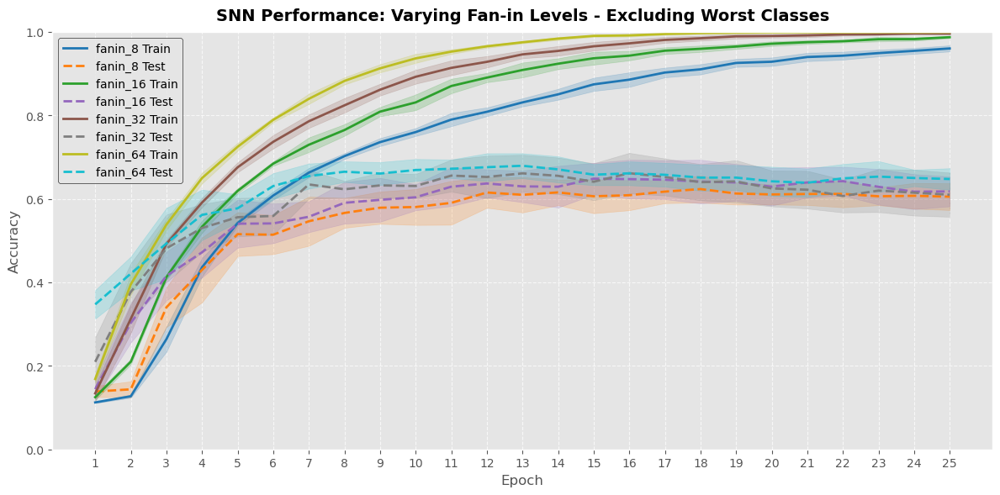

In [7]:
plot_convergence(
    file_path="experiments/fan_in_top_128_10_classes_20251216_1723.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [8]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_128_10_classes_20251209_115639.npz",
)

FileNotFoundError: [Errno 2] No such file or directory: 'experiments/fan_in_top_128_10_classes_20251209_115639.npz'

### TOP 5 classes

In [9]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=32,
    verbose=True,
    num_outputs=5,
    num_inputs=128,
    input_file="spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['full_can', 'empty_hand', 'spray_can', 'lotion', 'mug']
)

Loaded data from preprocessed_data/spike_data_topn_128_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 128, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['empty_hand', 'full_can', 'lotion', 'mug', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Test class

Available keys in experiments/fan_in_top_128_5_classes_20251216_1735.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


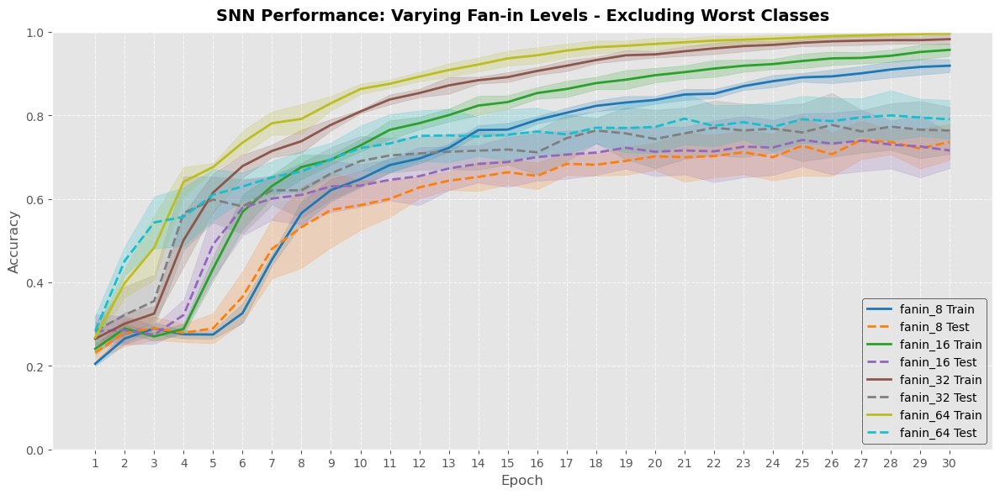

In [10]:
plot_convergence(
    file_path="experiments/fan_in_top_128_5_classes_20251216_1735.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_128_5_classes_20251216_1735.npz",
)

Available keys in experiments/fan_in_top_128_5_classes_20251210_101816.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.988571            0.900000                0.977320               0.750458
  fanin_16             0.994366            0.933333                0.990905               0.781438
  fanin_32             1.000000            0.966667                0.994889               0.800523
  fanin_64             1.000000            0.955556                0.999429               0.790458


## TOPN = 64

### Confusion matrix

In [11]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
F

### TOP 10 classes

In [12]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=32,
    verbose=True,
    num_outputs=10,
    num_inputs=64,
    input_file="spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['pen', 'mug', 'screw_driver', 'spray_can', 'lotion', 'safety_glasses', 'full_can', 'bracket', 'stapler', 'empty_hand']
)

Loaded data from preprocessed_data/spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['bracket', 'empty_hand', 'full_can', 'lotion', 'mug', 'pen', 'safety_glasses', 'screw_driver', 'spray_can', 'stapler']
→ New number of classes: 10
Fold 1: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 700, CV Test samples = 180
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70]
  - CV Test class distributio

Available keys in experiments/fan_in_top_64_10_classes_20251216_1838.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


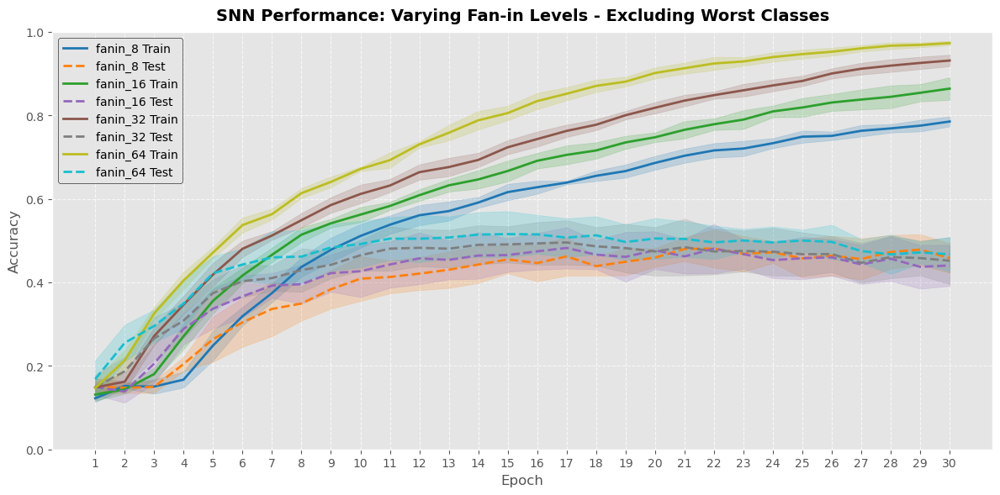

In [13]:
plot_convergence(
    file_path="experiments/fan_in_top_64_10_classes_20251216_1838.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_64_10_classes_20251216_1838.npz",
)

Available keys in experiments/fan_in_top_64_10_classes_20251209_131635.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.795714            0.517647                0.769384               0.435490
  fanin_16             0.875714            0.570588                0.851489               0.452614
  fanin_32             0.948571            0.547059                0.927879               0.454183
  fanin_64             0.980000            0.561111                0.971312               0.430850


### TOP 5 classes

In [14]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=80,
    batch_size=32,
    verbose=True,
    num_outputs=5,
    num_inputs=64,
    input_file="spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['pen', 'mug', 'screw_driver', 'spray_can', 'lotion']
)

Loaded data from preprocessed_data/spike_data_topn_64_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 64, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['lotion', 'mug', 'pen', 'screw_driver', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Test class dist

Available keys in experiments/fan_in_top_64_5_classes_20251216_1853.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


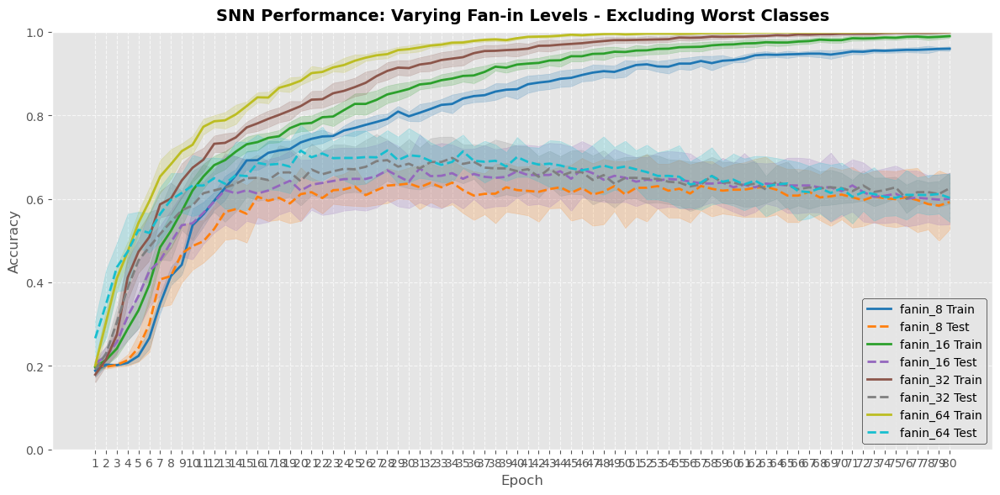

In [15]:
plot_convergence(
    file_path="experiments/fan_in_top_64_5_classes_20251216_1853.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_64_5_classes_20251216_1853.npz",
)

Available keys in experiments/fan_in_top_64_5_classes_20251210_1104.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.971429            0.788889                0.961360               0.601046
  fanin_16             0.994286            0.766667                0.986390               0.584967
  fanin_32             1.000000            0.811111                0.999429               0.618039
  fanin_64             1.000000            0.811111                1.000000               0.626013


## TOPN = 32

### Confusion matrix

In [16]:
results = run_confusion_matrix_experiment(
    device=device,
    num_folds=5,
    num_epochs=30,
    batch_size=32,
    verbose=True,
    input_file="spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    alpha=0.5,
    beta=0.9
)

Loaded data from preprocessed_data/spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 3: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
F

### TOP 5 classes

In [17]:
reuslts = run_fanin_experiment(
    device=device,
    num_folds=5,
    num_epochs=75,
    batch_size=32,
    verbose=True,
    num_outputs=5,
    num_inputs=32,
    input_file="spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl",
    fanin_values=[8, 16, 32, 64],
    alpha=0.5,
    beta=0.9,
    include_classes=['lotion', 'safety_glasses', 'coin', 'screw_driver', 'spray_can']
)

Loaded data from preprocessed_data/spike_data_topn_32_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 32, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Keeping classes: ['coin', 'lotion', 'safety_glasses', 'screw_driver', 'spray_can']
→ New number of classes: 5
Fold 1: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 2: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 3: CV Train samples = 350, CV Test samples = 90
  - CV Train class distribution: [70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18]
Fold 4: CV Train samples = 355, CV Test samples = 85
  - CV Train class distribution: [71 71 71 71 71]
  - CV Tes

Available keys in experiments/fan_in_top_32_5_classes_20251216_1932.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']


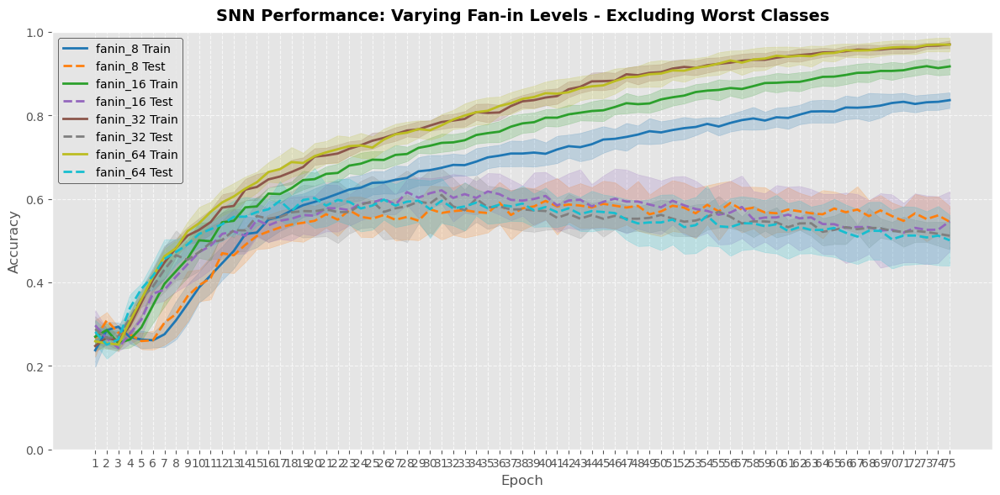

In [ ]:
plot_convergence(
    file_path="experiments/fan_in_top_32_5_classes_20251216_1932.npz",
    save_path="figures/fanin_convergence_excluded.png",
    plt_title="SNN Performance: Varying Fan-in Levels - Excluding Worst Classes",
    plot_std=True)

In [ ]:
analyze_experiment_results(
    file_path="experiments/fan_in_top_32_5_classes_20251216_1932.npz",
)

Available keys in experiments/fan_in_top_32_5_classes_20251210_1120.npz: ['fanin_8', 'fanin_16', 'fanin_32', 'fanin_64']
Table saved to experiments/analysis_fanin_experiment_excluded.txt

Experiment Results Table:
Model/Loss  Best Train Accuracy  Best Test Accuracy  Average Train Accuracy  Average Test Accuracy
   fanin_8             0.862857            0.666667                0.838680               0.468497
  fanin_16             0.945714            0.666667                0.919960               0.502222
  fanin_32             0.982857            0.666667                0.972781               0.504967
  fanin_64             0.994286            0.633333                0.967718               0.468366


## Top pixels vs random pixels

### TOPN = 300

In [19]:
fixed_params = {"topn": 300, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="rand_pixels",
    varying_values=[None],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for rand_pixels = None from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_300_num_frames_25_threshold_0.01_channels_1_down_spike_1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 300, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'channels': 1, 'down_spike': 1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 7

In [ ]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="rand_pixels",
    varying_values=[300],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=12,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for rand_pixels = 300 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_True_down_spike_-1.0_encoding_spike_rand_pixels_300_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_True_down_spike_-1.0_encoding_spike_rand_pixels_300_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'flatten_channels': True, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': 300}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribu

In [ ]:
fixed_params = {"topn": 200, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="rand_pixels",
    varying_values=[None],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for rand_pixels = None from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_flatten_channels_True_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_200_num_frames_25_threshold_0.01_flatten_channels_True_down_spike_-1.0_encoding_spike_rand_pixels_None_session_id_0_1.pkl with params: {'topn': 200, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'flatten_channels': True, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': None}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distrib

In [ ]:
fixed_params = {"topn": None, "num_frames": 25, "threshold": 0.01, "session_id": [0, 1], "channels": 1, "down_spike": 1.0, "encoding": "spike"}
results_num_frames = run_param_experiment(
    varying_param="rand_pixels",
    varying_values=[200],
    fixed_params=fixed_params,
    num_folds=5,
    num_epochs=15,
    batch_size=32,
    device=device,
    verbose=True,
    alpha=0.7,
    beta=0.5
)


######################################################################
Running experiment for rand_pixels = 200 from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_True_down_spike_-1.0_encoding_spike_rand_pixels_200_session_id_0_1.pkl
######################################################################
Loaded data from preprocessed_data/spike_data_topn_None_num_frames_25_threshold_0.01_flatten_channels_True_down_spike_-1.0_encoding_spike_rand_pixels_200_session_id_0_1.pkl with params: {'topn': None, 'num_frames': 25, 'threshold': 0.01, 'session_id': [0, 1], 'flatten_channels': True, 'down_spike': -1.0, 'encoding': 'spike', 'rand_pixels': 200}
Fold 1: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribution: [70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70 70]
  - CV Test class distribution: [18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18]
Fold 2: CV Train samples = 1190, CV Test samples = 306
  - CV Train class distribu